# 1. Loading general Libraries

In [ ]:
from osgeo import gdal
import matplotlib.pyplot as plt
import numpy as np
import glob
import cv2
import os
import re
import tensorflow as tf
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import pandas as pd
import os

# 2. Loading and Visualize Images and Masks

In [2]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [3]:
def extract_custom_id(filename):
    match = re.search(r"CUSTOM_ID_(\d+)", filename)
    if match:
        return int(match.group(1))
    return 0  # Return 0 if no match is found

# Image and mask folder paths
image_folder = '/content/drive/MyDrive/BUSM130/Data/lavender_images/'
mask_folder = '/content/drive/MyDrive/BUSM130/Data/lavender_masks/'

# Get lists of image and mask file paths
image_files = [filename for filename in os.listdir(image_folder) if filename.endswith(".tiff")]
mask_files = [filename for filename in os.listdir(mask_folder) if filename.startswith("mask_")]

# Sort the file lists based on the number after "CUSTOM_ID_"
sorted_image_files = sorted(image_files, key=extract_custom_id)
sorted_mask_files = sorted(mask_files, key=extract_custom_id)

In [4]:
# Create lists to store image and mask data
all_image_data = []
masks_data = []

for image_filename, mask_filename in zip(sorted_image_files, sorted_mask_files):
    image_path = os.path.join(image_folder, image_filename)
    mask_path = os.path.join(mask_folder, mask_filename)

    # Load image and mask data using gdal
    image_dataset = gdal.Open(image_path)
    image_array = image_dataset.ReadAsArray()
    all_image_data.append(image_array)

    mask_dataset = gdal.Open(mask_path)
    mask_array = mask_dataset.ReadAsArray()
    masks_data.append(mask_array)

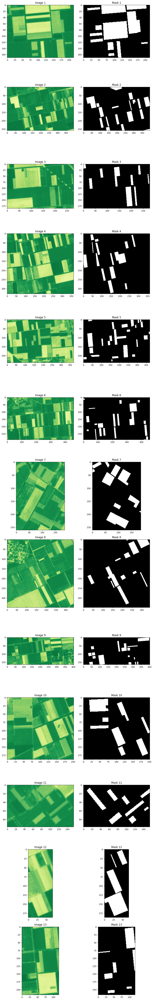

In [5]:
num_rows = len(all_image_data)
num_columns = 2  # Each row will have 2 columns: NDVI image and mask

# Create a new figure with the desired number of rows and columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 5 * num_rows))

# Loop through all the Sentinel-2 images and masks
for i, (sentinel_image, mask_image) in enumerate(zip(all_image_data, masks_data)):

    # Calculate NDVI for the current image
    band8 = sentinel_image[7, :, :]  # NIR band
    band4 = sentinel_image[3, :, :]  # Red band
    ndvi = (band8 - band4) / (band8 + band4)

    # Plot the NDVI image in the first column
    ax = axes[i, 0]
    ax.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1,)
    ax.set_title("Image " + str(i+1))
    ax.axis('on')

    # Plot the mask image in the second column
    ax = axes[i, 1]
    ax.imshow(mask_image, cmap='gray')
    ax.set_title("Mask " + str(i+1))
    ax.axis('on')

plt.tight_layout()
plt.show()

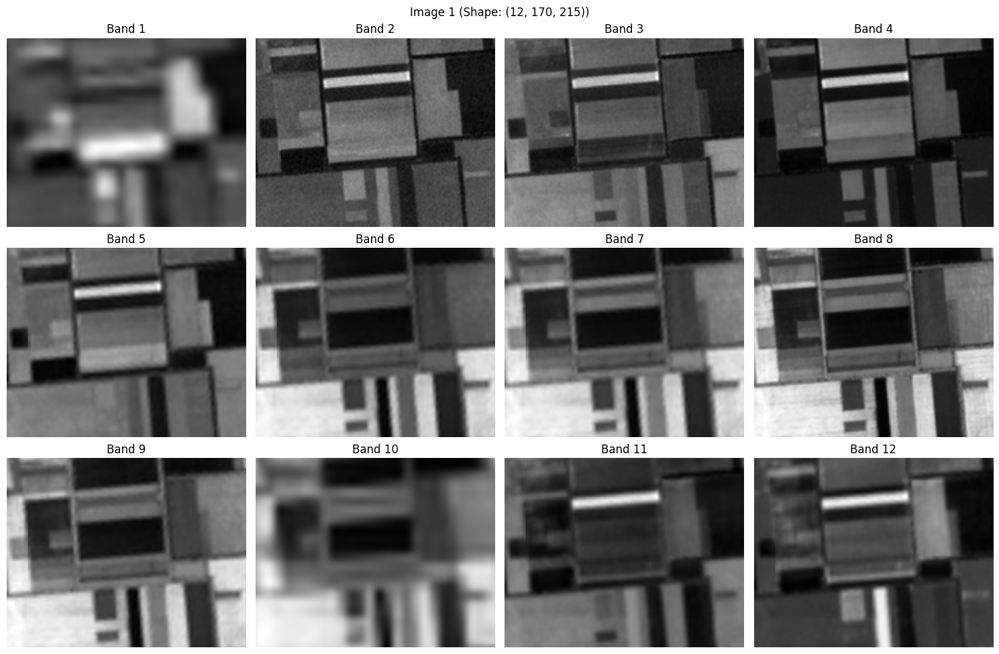

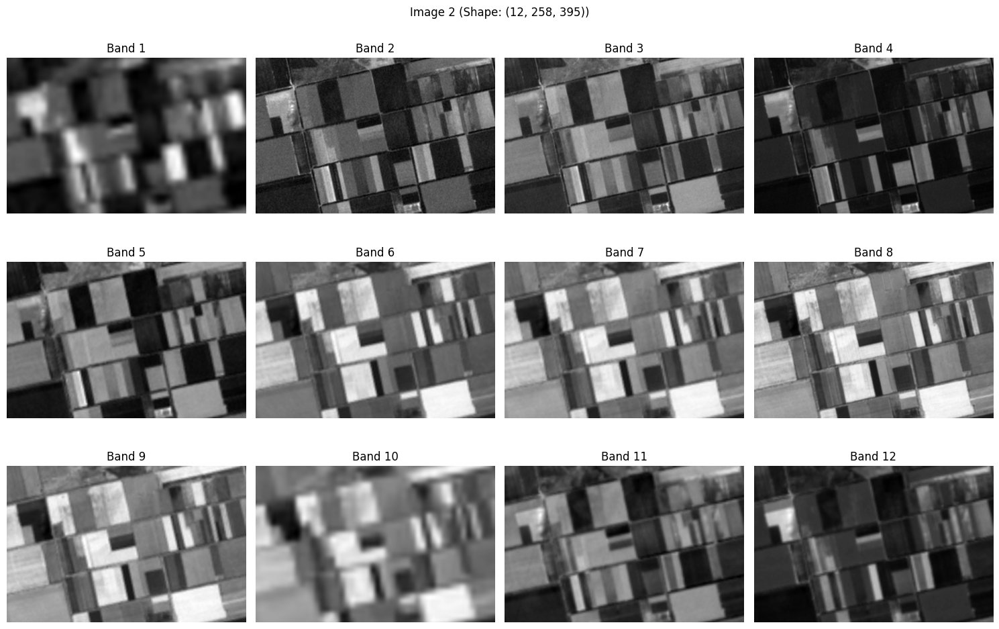

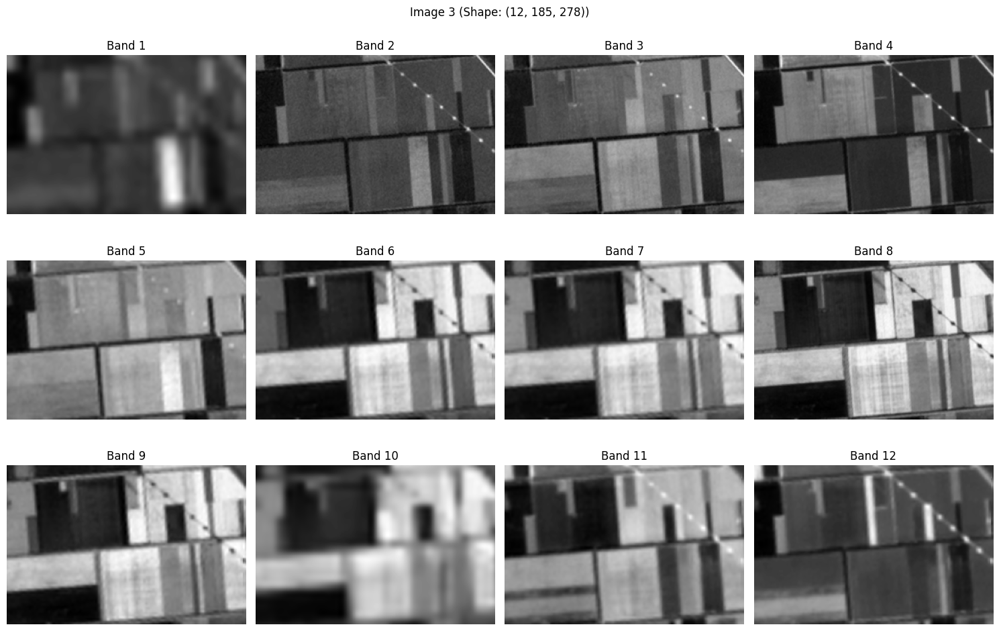

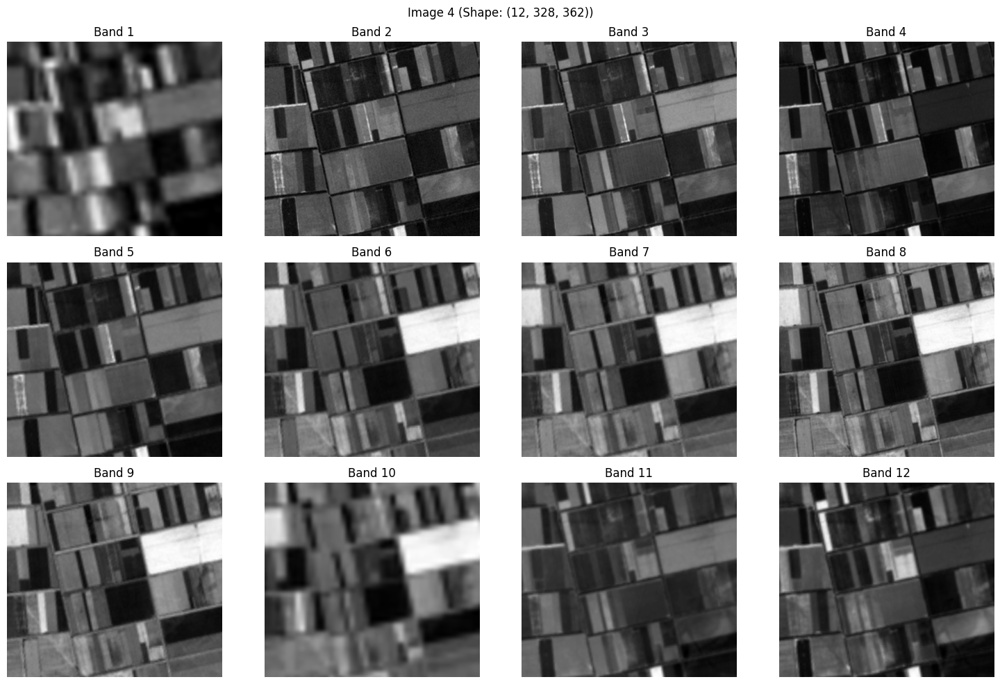

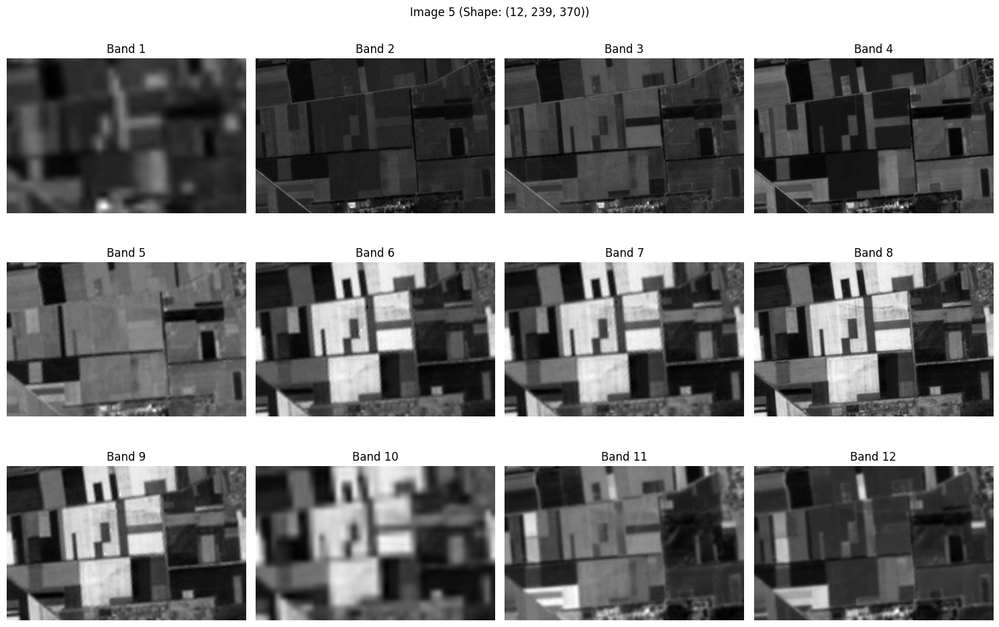

...

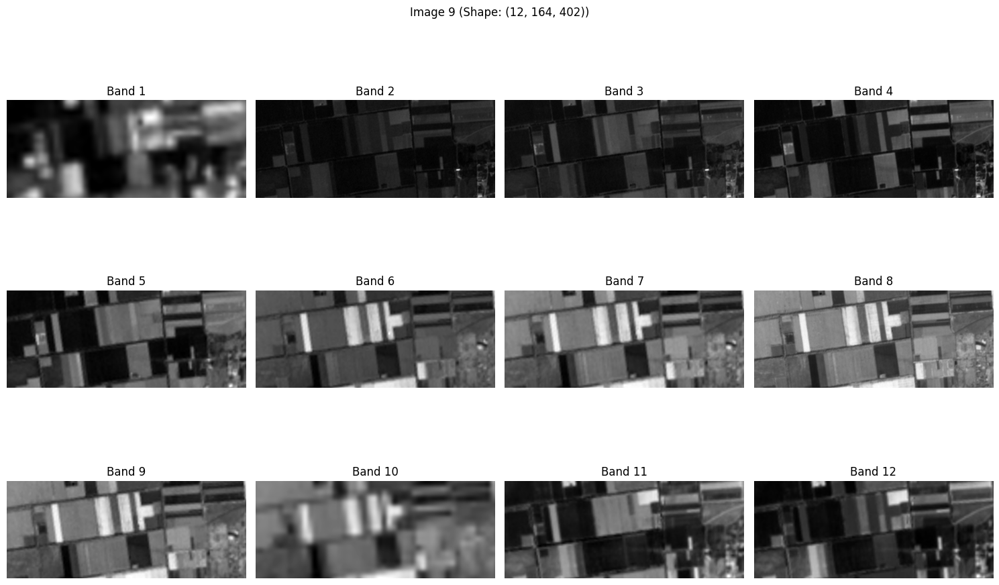

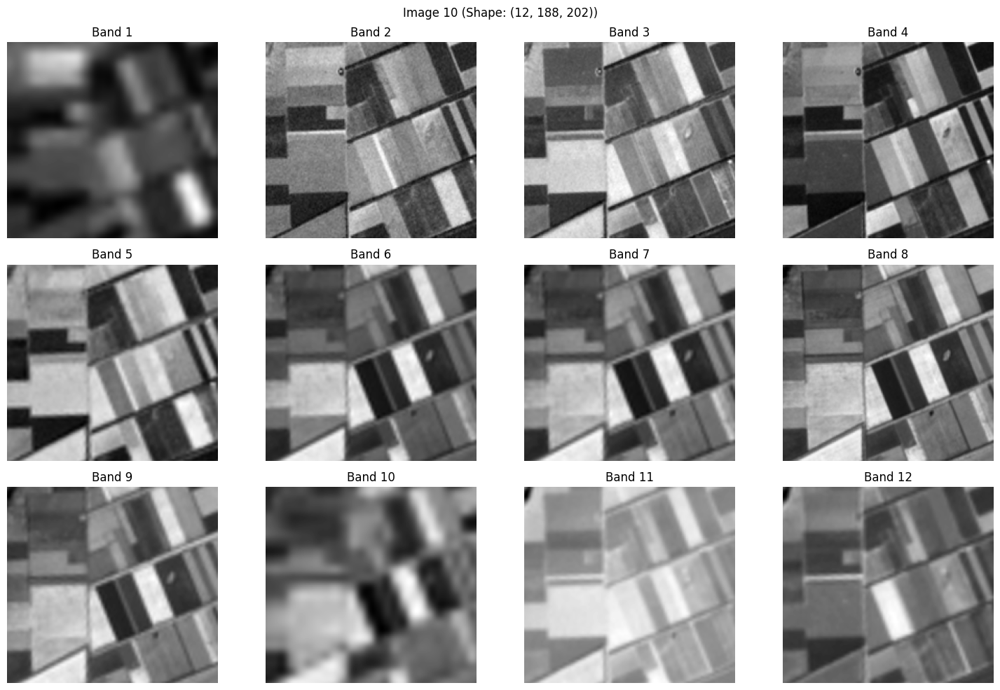

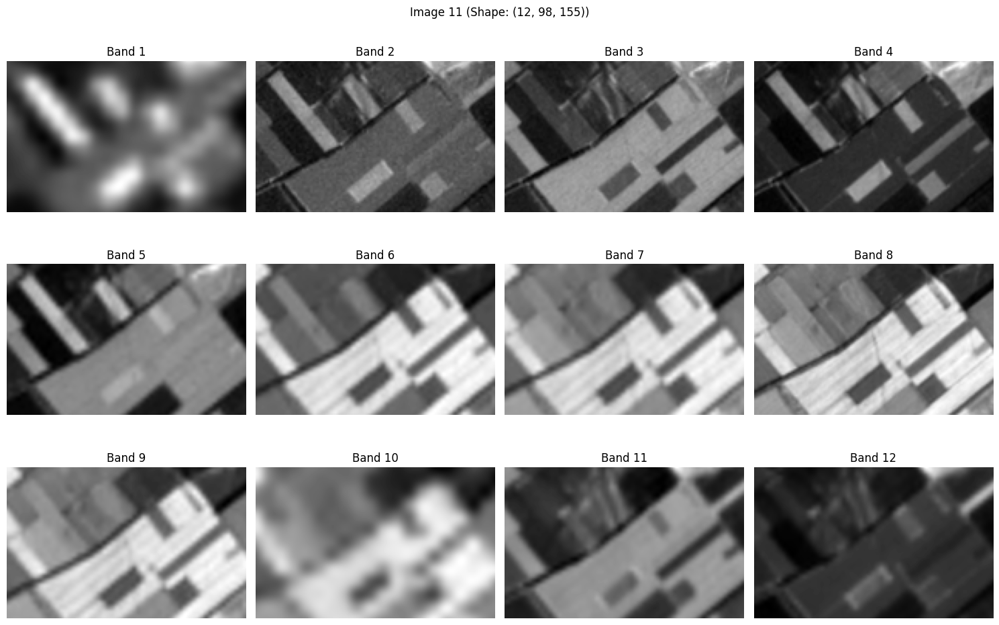

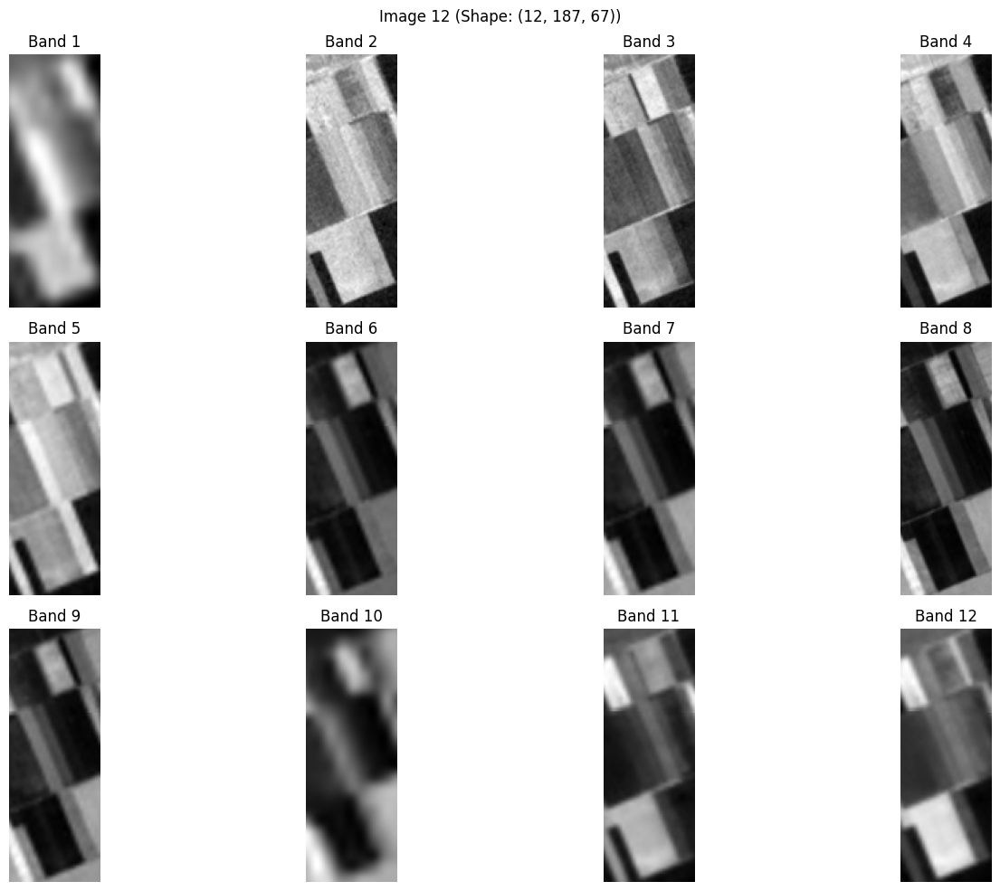

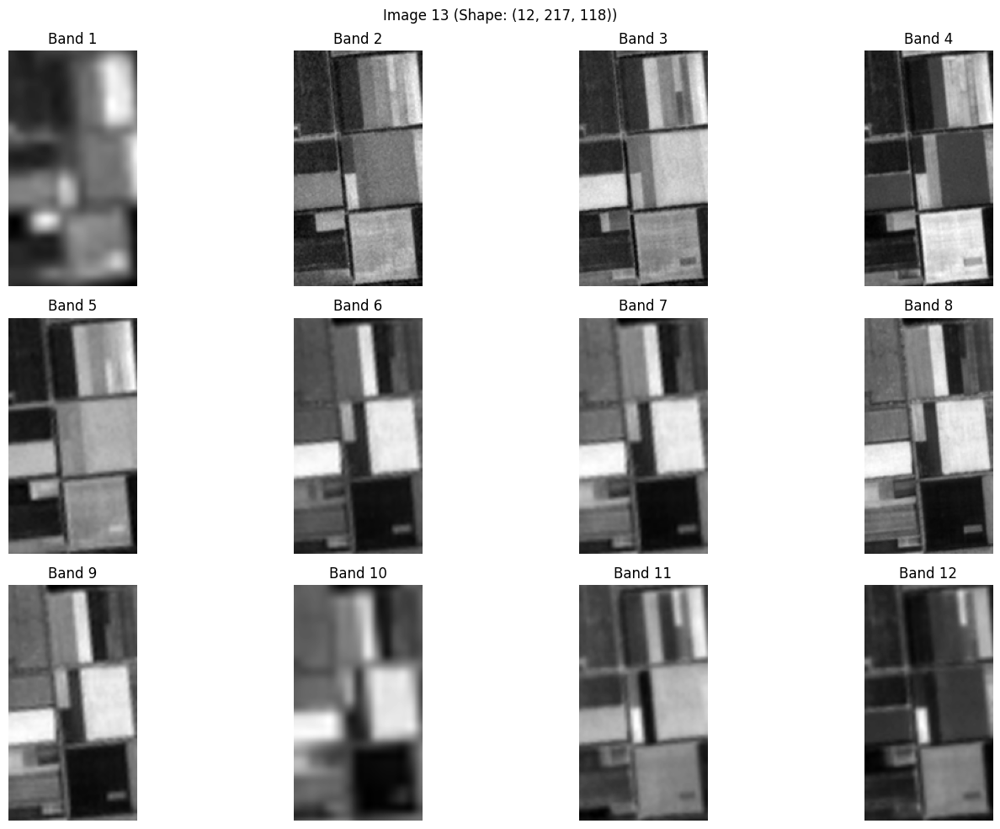

In [7]:
# Get the number of images
num_images = len(all_image_data)

for image_index in range(num_images):
    num_bands = all_image_data[image_index].shape[0]  # Get the number of bands for the current image
    fig, axes = plt.subplots(3, 4, figsize=(15, 10))
    for band_index in range(num_bands):
        row = band_index // 4
        col = band_index % 4
        band_data = all_image_data[image_index][band_index]
        axes[row, col].imshow(band_data, cmap='gray')
        axes[row, col].set_title(f'Band {band_index + 1}')
        axes[row, col].axis('off')
    plt.suptitle(f'Image {image_index + 1} (Shape: {all_image_data[image_index].shape})')
    plt.tight_layout()
    plt.show()


# 3. Image Normalization and Data Split

In [8]:
transpose_images_data = []

for image in all_image_data:
    reshaped_image = np.transpose(image, (1, 2, 0))
    transpose_images_data.append(reshaped_image)

In [9]:
# Set random seeds for reproducibility
seed = 43
tf.random.set_seed(seed)
np.random.seed(seed)

def min_max_normalization(image):
    min_val = np.min(image)
    max_val = np.max(image)
    normalized_image = (image - min_val) / (max_val - min_val)
    return normalized_image

def normalize_image_dataset(image_dataset):
    normalized_dataset = []
    for image in image_dataset:
        normalized_image = min_max_normalization(image)
        normalized_dataset.append(normalized_image)
    return normalized_dataset

# Normalize the entire dataset
image_data = normalize_image_dataset(transpose_images_data)

In [12]:
# Split the normalized images and masks into train and test sets
X_train, X_temp, y_train, y_temp = train_test_split(image_data, masks_data, test_size=0.5, random_state=seed)

# Further split the temporary set into validation and test sets
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=seed)

# 4. Data Augmentation and Concatenation

In [14]:
# Set a fixed seed value for reproducibility
seed_value = 42
np.random.seed(seed_value)
augmentation_seed = 42

fliplr_probs = [0.5, 0.8, 0.3]
flipud_probs = [0.5, 0.8, 0.3]

def augment_images(image_data, masks_data, augmentations_per_image=10):
    augmented_image_data = []
    augmented_masks_data = []

    for image, mask in zip(image_data, masks_data):
        for i in range(augmentations_per_image):
            augmentation_rng = np.random.default_rng(augmentation_seed + i)  # Different seed for each round

            # Select parameter values randomly from the lists
            fliplr_prob = augmentation_rng.choice(fliplr_probs)
            flipud_prob = augmentation_rng.choice(flipud_probs)

            seq = iaa.Sequential([
                iaa.Fliplr(fliplr_prob),
                iaa.Flipud(flipud_prob),
                iaa.Affine(rotate=(-5, 5), random_state=augmentation_rng),
                iaa.Affine(scale=(0.9, 1.1), random_state=augmentation_rng),
            ], random_order=True, random_state=augmentation_rng)

            aug_det = seq.to_deterministic()  # ensures that augmentations are the same for image and mask
            image_aug = aug_det.augment_image(image)
            mask_aug = aug_det.augment_image(mask)

            augmented_image_data.append(image_aug)
            augmented_masks_data.append(mask_aug)

    return np.array(augmented_image_data), np.array(augmented_masks_data)

augmented_images, augmented_masks = augment_images(X_train, y_train, augmentations_per_image=10)

<ipython-input-14-82a6da5308ec>:41: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(augmented_image_data), np.array(augmented_masks_data)


In [15]:
X_train_final = np.concatenate((X_train, augmented_images), axis=0)
y_train_final = np.concatenate((y_train, augmented_masks), axis=0)

<__array_function__ internals>:180: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.


# 5. Padding and Patching

In [16]:
print(X_train_final[0].dtype)
print(y_train_final[0].dtype)
print(X_test[0].dtype)
print(y_test[0].dtype)
print(X_val[0].dtype)
print(y_val[0].dtype)

print(X_train_final[0].shape)
print(y_train_final[0].shape)
print(X_test[0].shape)
print(y_test[0].shape)
print(X_val[0].shape)
print(y_val[0].shape)

float32
uint8
float32
uint8
float32
uint8
(328, 362, 12)
(328, 362)
(185, 278, 12)
(185, 278)
(164, 402, 12)
(164, 402)


In [17]:
# Create an empty list to store the reshaped images
X_train_transpose = []
X_val_transpose = []
X_test_transpose = []

for image in X_train_final:
    reshaped_image = np.transpose(image, (2, 0, 1))
    X_train_transpose.append(reshaped_image)

for image in X_val:
    reshaped_image = np.transpose(image, (2, 0, 1))
    X_val_transpose.append(reshaped_image)

for image in X_test:
    reshaped_image = np.transpose(image, (2, 0, 1))
    X_test_transpose.append(reshaped_image)

In [18]:
print(X_train_transpose[0].shape)
print(X_val_transpose[0].shape)
print(X_test_transpose[0].shape)

(12, 328, 362)
(12, 164, 402)
(12, 185, 278)


In [19]:
def pad_images(images, masks, patch_size):
    padded_images = []
    padded_masks = []

    for i in range(len(images)):
        image = images[i]
        mask = masks[i]

        num_channels, height, width = image.shape

        # Calculate the padding required
        pad_height = ((height + patch_size - 1) // patch_size) * patch_size - height
        pad_width = ((width + patch_size - 1) // patch_size) * patch_size - width

        # Apply padding to images and masks
        padded_image = np.pad(image, ((0, 0), (0, pad_height), (0, pad_width)), mode='constant')
        padded_mask = np.pad(mask, ((0, pad_height), (0, pad_width)), mode='constant')

        padded_images.append(padded_image)
        padded_masks.append(padded_mask)

    return padded_images, padded_masks

patch_size = 128

# Pad the images and masks to be divisible by 128
X_train_padded, y_train_padded = pad_images(X_train_transpose, y_train_final, patch_size)
X_val_padded, y_val_padded = pad_images(X_val_transpose, y_val, patch_size)
X_test_padded, y_test_padded = pad_images(X_test_transpose, y_test, patch_size)

In [20]:
print(X_train_transpose[0].shape)
print(X_val_transpose[0].shape)
print(X_test_transpose[0].shape)

print(X_train_padded[0].shape)
print(X_val_padded[0].shape)
print(X_test_padded[0].shape)

(12, 328, 362)
(12, 164, 402)
(12, 185, 278)
(12, 384, 384)
(12, 256, 512)
(12, 256, 384)


In [21]:
def divide_into_patches(images, masks, patch_size):
    divided_images = []
    divided_masks = []

    for i in range(len(images)):
        image = images[i]
        mask = masks[i]

        num_channels, height, width = image.shape
        num_patches_h = height // patch_size
        num_patches_w = width // patch_size

        for h in range(num_patches_h):
            for w in range(num_patches_w):
                patch_image = image[:, h*patch_size:(h+1)*patch_size, w*patch_size:(w+1)*patch_size]
                patch_mask = mask[h*patch_size:(h+1)*patch_size, w*patch_size:(w+1)*patch_size]

                divided_images.append(patch_image)
                divided_masks.append(patch_mask)

    return divided_images, divided_masks

# Specify the patch size you want
patch_size = 128

# Divide the images and masks into patches
X_train_128, y_train_128 = divide_into_patches(X_train_padded, y_train_padded, patch_size)
X_test_128, y_test_128 = divide_into_patches(X_test_padded, y_test_padded, patch_size)
X_val_128, y_val_128 = divide_into_patches(X_val_padded, y_val_padded, patch_size)

In [22]:
X_train_128 = np.array(X_train_128)
X_test_128 = np.array(X_test_128)
y_train_128 = np.array(y_train_128)
y_test_128 = np.array(y_test_128)
X_val_128 = np.array(X_val_128)
y_val_128 = np.array(y_val_128)

In [23]:
print(X_train_128.shape)
print(y_train_128.shape)
print(X_val_128.shape)
print(y_val_128.shape)
print(X_test_128.shape)
print(y_test_128.shape)

(495, 12, 128, 128)
(495, 128, 128)
(18, 12, 128, 128)
(18, 128, 128)
(19, 12, 128, 128)
(19, 128, 128)


In [24]:
X_train_128 = np.transpose(X_train_128, (0, 2, 3, 1))
X_test_128 = np.transpose(X_test_128, (0, 2, 3, 1))
X_val_128 = np.transpose(X_val_128, (0, 2, 3, 1))

In [25]:
print(X_train_128.shape)
print(X_val_128.shape)
print(X_test_128.shape)
print(y_train_128.shape)
print(y_val_128.shape)
print(y_test_128.shape)


(495, 128, 128, 12)
(18, 128, 128, 12)
(19, 128, 128, 12)
(495, 128, 128)
(18, 128, 128)
(19, 128, 128)


In [26]:
print(X_train_128.dtype)
print(y_train_128.dtype)
print(y_val_128.dtype)
print(X_val_128.dtype)
print(y_test_128.dtype)
print(X_test_128.dtype)


float32
uint8
uint8
float32
uint8
float32


In [27]:
y_train_128 = y_train_128.astype(np.float32)
y_val_128 = y_val_128.astype(np.float32)
y_test_128 = y_test_128.astype(np.float32)


In [28]:
print(X_train_128.dtype)
print(y_train_128.dtype)
print(y_val_128.dtype)
print(X_val_128.dtype)
print(y_test_128.dtype)
print(X_test_128.dtype)


float32
float32
float32
float32
float32
float32


# 6. Remove Black Patches

In [29]:
mask_sum = y_train_128.sum(axis=(1, 2))  # Sum the pixel values along spatial dimensions (height and width)
non_zero_indices = np.nonzero(mask_sum)  # Get the indices of patches with non-zero mask values
X_train_images = X_train_128[non_zero_indices]
y_train_masks = y_train_128[non_zero_indices]
print(X_train_images.shape)
print(y_train_masks.shape)

mask_sum = y_test_128.sum(axis=(1, 2))  # Sum the pixel values along spatial dimensions (height and width)
non_zero_indices = np.nonzero(mask_sum)  # Get the indices of patches with non-zero mask values
X_test_images = X_test_128[non_zero_indices]
y_test_masks = y_test_128[non_zero_indices]
print(X_test_images.shape)
print(y_test_masks.shape)

mask_sum = y_val_128.sum(axis=(1, 2))  # Sum the pixel values along spatial dimensions (height and width)
non_zero_indices = np.nonzero(mask_sum)  # Get the indices of patches with non-zero mask values
X_val_images = X_val_128[non_zero_indices]
y_val_masks = y_val_128[non_zero_indices]
print(X_val_images.shape)
print(y_val_masks.shape)

(414, 128, 128, 12)
(414, 128, 128)
(14, 128, 128, 12)
(14, 128, 128)
(15, 128, 128, 12)
(15, 128, 128)


In [30]:
X_train_128 = X_train_images.copy()
y_train_128 = y_train_masks.copy()
X_val_128 = X_val_images.copy()
y_val_128 = y_val_masks.copy()
X_test_128 = X_test_images.copy()
y_test_128 = y_test_masks.copy()

y_train_128 = np.expand_dims(y_train_128, axis=-1)
y_test_128 = np.expand_dims(y_test_128, axis=-1)
y_val_128 = np.expand_dims(y_val_128, axis=-1)

print(X_train_128.shape)
print(y_train_128.shape)
print(X_val_128.shape)
print(y_val_128.shape)
print(X_test_128.shape)
print(y_test_128.shape)

(414, 128, 128, 12)
(414, 128, 128, 1)
(15, 128, 128, 12)
(15, 128, 128, 1)
(14, 128, 128, 12)
(14, 128, 128, 1)


In [31]:
y_test_128.shape

(14, 128, 128, 1)

# 7. Define Dice Coefficient

In [ ]:
import keras.backend as K

def dice_coefficient(y_true, y_pred):
    threshold = 0.5
    y_pred_thresholded = K.cast(y_pred > threshold, K.floatx())

    intersection = K.sum(y_true * y_pred_thresholded)
    dice_numerator = 2 * intersection
    dice_denominator = K.sum(y_true) + K.sum(y_pred_thresholded)
    dice_score = dice_numerator / dice_denominator

    return dice_score

# 8. MODEL 1 - UNET

In [32]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout

def down_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(x)
    c = Dropout(0.2)(c)
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(c)
    c = Dropout(0.2)(c)
    p = MaxPooling2D((2, 2), (2, 2))(c)
    return c, p

def up_block(x, skip, filters, kernel_size=(3, 3), padding="same", strides=1):
    us = UpSampling2D((2, 2))(x)
    concat = concatenate([us, skip])
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(concat)
    c = Dropout(0.2)(c)  # Adding dropout with a rate of 0.2
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(c)
    c = Dropout(0.2)(c)  # Adding dropout with a rate of 0.2
    return c

def bottleneck(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(x)
    c = Dropout(0.2)(c)
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(c)
    c = Dropout(0.2)(c)
    return c

def UNet():
    f = [16, 32, 64, 128, 256]
    inputs = Input((128, 128, 12))

    p0 = inputs
    c1, p1 = down_block(p0, f[0])
    c2, p2 = down_block(p1, f[1])
    c3, p3 = down_block(p2, f[2])
    c4, p4 = down_block(p3, f[3])

    bn = bottleneck(p4, f[4])

    u1 = up_block(bn, c4, f[3])
    u2 = up_block(u1, c3, f[2])
    u3 = up_block(u2, c2, f[1])
    u4 = up_block(u3, c1, f[0])

    outputs = Conv2D(1, (1, 1), padding="same", activation="sigmoid")(u4)
    model = Model(inputs, outputs)
    return model

# Create the UNet model
model_newUnet = UNet()

# Compile the model
model_newUnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])

# Train the model
history = model_newUnet.fit(X_train_128, y_train_128,
                            batch_size=16,
                            verbose=1,
                            epochs=100,
                            validation_data=(X_val_128, y_val_128),
                            shuffle=True)

Epoch 1/100
26/26 [==============================] - 23s 163ms/step - loss: 0.4370 - dice_coefficient: 0.0449 - val_loss: 0.3056 - val_dice_coefficient: 0.0000e+00
Epoch 2/100
26/26 [==============================] - 2s 61ms/step - loss: 0.2839 - dice_coefficient: 2.7857e-04 - val_loss: 0.2973 - val_dice_coefficient: 0.0000e+00
Epoch 3/100
26/26 [==============================] - 2s 61ms/step - loss: 0.2391 - dice_coefficient: 2.4418e-06 - val_loss: 0.1902 - val_dice_coefficient: 0.0000e+00
Epoch 4/100
26/26 [==============================] - 2s 58ms/step - loss: 0.2274 - dice_coefficient: 5.1397e-06 - val_loss: 0.1751 - val_dice_coefficient: 0.0000e+00
Epoch 5/100
26/26 [==============================] - 1s 56ms/step - loss: 0.2107 - dice_coefficient: 2.0548e-06 - val_loss: 0.1747 - val_dice_coefficient: 0.0000e+00
Epoch 6/100
26/26 [==============================] - 1s 58ms/step - loss: 0.2031 - dice_coefficient: 2.8095e-06 - val_loss: 0.1454 - val_dice_coefficient: 0.0000e+00
Epoch 

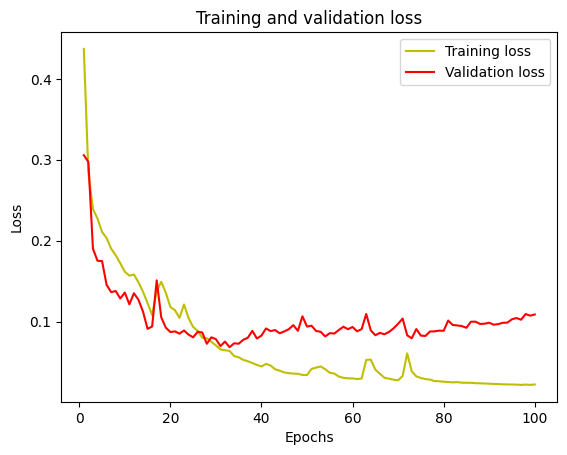

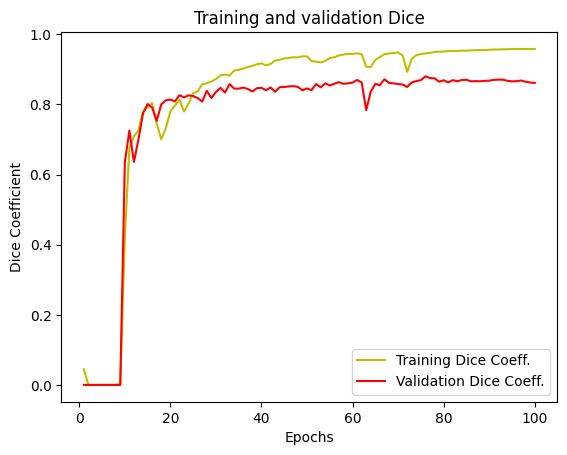

In [33]:
############################################################
#Evaluate the model
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


jc = history.history['dice_coefficient']
val_jc = history.history['val_dice_coefficient']

plt.plot(epochs, jc, 'y', label='Training Dice Coeff.')
plt.plot(epochs, val_jc, 'r', label='Validation Dice Coeff.')
plt.title('Training and validation Dice')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.show()

In [34]:
# Evaluate the model on the training set
train_loss, train_dice_coeff = model_newUnet.evaluate(X_train_128, y_train_128, verbose=0)

# Evaluate the model on the val set
val_loss, val_dice_coeff = model_newUnet.evaluate(X_val_128, y_val_128, verbose=0)

# Print the results
print("Training Loss:", train_loss)
print("Training Dice Coefficient:", train_dice_coeff)
print("Val Loss:", val_loss)
print("Val Dice Coefficient:", val_dice_coeff)


Training Loss: 0.028427494689822197
Training Dice Coefficient: 0.9472788572311401
Val Loss: 0.108686663210392
Val Dice Coefficient: 0.8616410493850708


## Handling Overfitting problem

In [62]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout
from keras.callbacks import EarlyStopping

def down_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(x)
    c = Dropout(0.2)(c)
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(c)
    c = Dropout(0.2)(c)
    p = MaxPooling2D((2, 2), (2, 2))(c)
    return c, p

def up_block(x, skip, filters, kernel_size=(3, 3), padding="same", strides=1):
    us = UpSampling2D((2, 2))(x)
    concat = concatenate([us, skip])
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(concat)
    c = Dropout(0.2)(c)  # Adding dropout with a rate of 0.2
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(c)
    c = Dropout(0.2)(c)  # Adding dropout with a rate of 0.2
    return c

def bottleneck(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(x)
    c = Dropout(0.2)(c)
    c = Conv2D(filters, kernel_size, padding=padding, strides=strides, activation="relu", kernel_initializer='he_normal')(c)
    c = Dropout(0.2)(c)
    return c

def UNet():
    f = [16, 32, 64, 128, 256]
    inputs = Input((128, 128, 12))

    p0 = inputs
    c1, p1 = down_block(p0, f[0])
    c2, p2 = down_block(p1, f[1])
    c3, p3 = down_block(p2, f[2])
    c4, p4 = down_block(p3, f[3])

    bn = bottleneck(p4, f[4])

    u1 = up_block(bn, c4, f[3])
    u2 = up_block(u1, c3, f[2])
    u3 = up_block(u2, c2, f[1])
    u4 = up_block(u3, c1, f[0])

    outputs = Conv2D(1, (1, 1), padding="same", activation="sigmoid")(u4)
    model = Model(inputs, outputs)
    return model

# Create the UNet model
model_newUnet2 = UNet()

# Compile the model
model_newUnet2.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])

# Define EarlyStopping callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True
)

# Train the model with early stopping
history = model_newUnet2.fit(X_train_128, y_train_128,
                            batch_size=16,
                            verbose=1,
                            epochs=100,
                            validation_data=(X_val_128, y_val_128),
                            shuffle=True,callbacks=[early_stopping])  # Add the EarlyStopping callback


Epoch 1/100
26/26 [==============================] - 10s 74ms/step - loss: 0.4834 - dice_coefficient: 0.0359 - val_loss: 0.2497 - val_dice_coefficient: 0.0000e+00
Epoch 2/100
26/26 [==============================] - 2s 59ms/step - loss: 0.2442 - dice_coefficient: 0.0016 - val_loss: 0.1980 - val_dice_coefficient: 0.0000e+00
Epoch 3/100
26/26 [==============================] - 2s 58ms/step - loss: 0.2161 - dice_coefficient: 0.0034 - val_loss: 0.1767 - val_dice_coefficient: 0.0000e+00
Epoch 4/100
26/26 [==============================] - 2s 59ms/step - loss: 0.2097 - dice_coefficient: 0.0013 - val_loss: 0.1710 - val_dice_coefficient: 0.0000e+00
Epoch 5/100
26/26 [==============================] - 2s 59ms/step - loss: 0.2010 - dice_coefficient: 4.7784e-04 - val_loss: 0.1461 - val_dice_coefficient: 0.0000e+00
Epoch 6/100
26/26 [==============================] - 2s 58ms/step - loss: 0.1919 - dice_coefficient: 0.0050 - val_loss: 0.1674 - val_dice_coefficient: 0.0000e+00
Epoch 7/100
26/26 [====

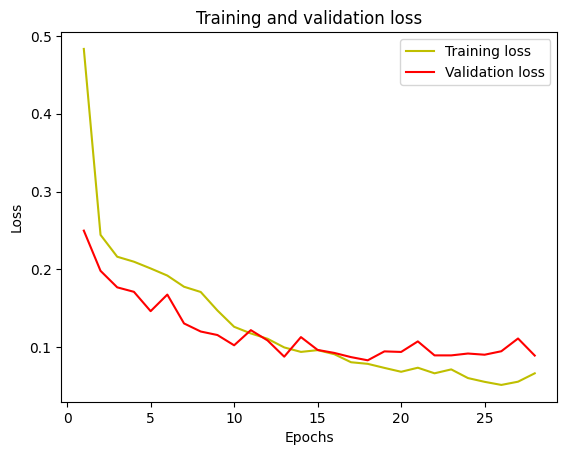

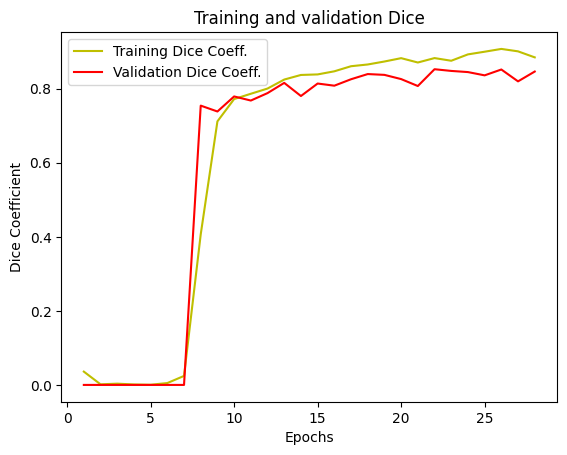

In [63]:
############################################################
#Evaluate the model

loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


jc = history.history['dice_coefficient']
val_jc = history.history['val_dice_coefficient']

plt.plot(epochs, jc, 'y', label='Training Dice Coeff.')
plt.plot(epochs, val_jc, 'r', label='Validation Dice Coeff.')
plt.title('Training and validation Dice')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.show()

In [64]:
# Evaluate the model on the training set
train_loss, train_dice_coeff = model_newUnet2.evaluate(X_train_128, y_train_128, verbose=0)

# Evaluate the model on the test set
val_loss, val_dice_coeff = model_newUnet2.evaluate(X_val_128, y_val_128, verbose=0)

# Print the results
print("Training Loss:", train_loss)
print("Training Dice Coefficient:", train_dice_coeff)
print("Val Loss:", val_loss)
print("Val Dice Coefficient:", val_dice_coeff)


Training Loss: 0.10009396821260452
Training Dice Coefficient: 0.8437080383300781
Val Loss: 0.08288528025150299
Val Dice Coefficient: 0.8395780920982361


1/1 [==============================] - 0s 206ms/step


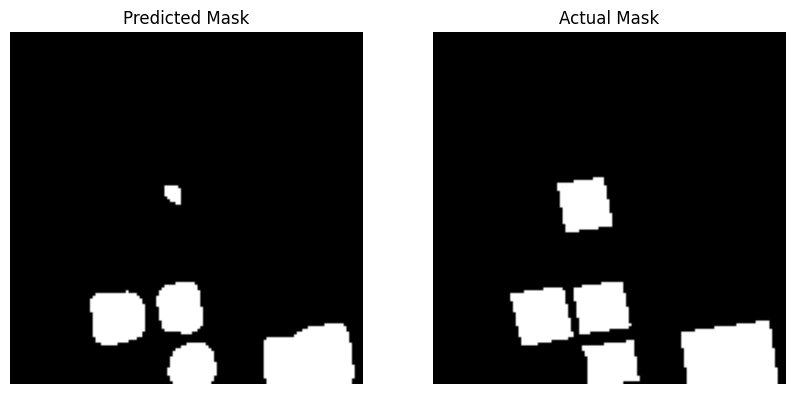

1/1 [==============================] - 0s 22ms/step


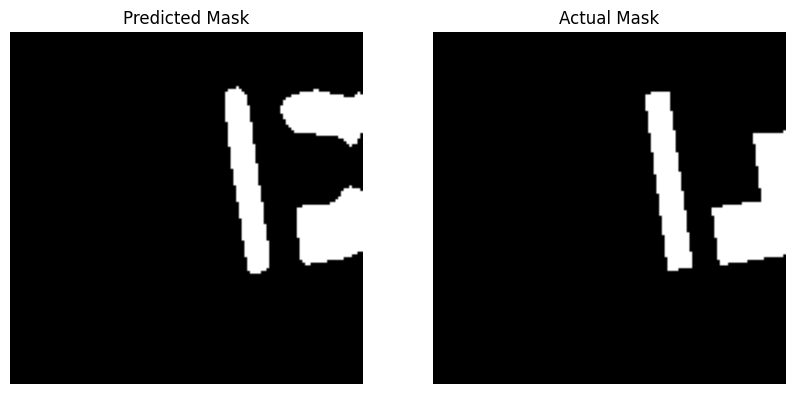

1/1 [==============================] - 0s 23ms/step


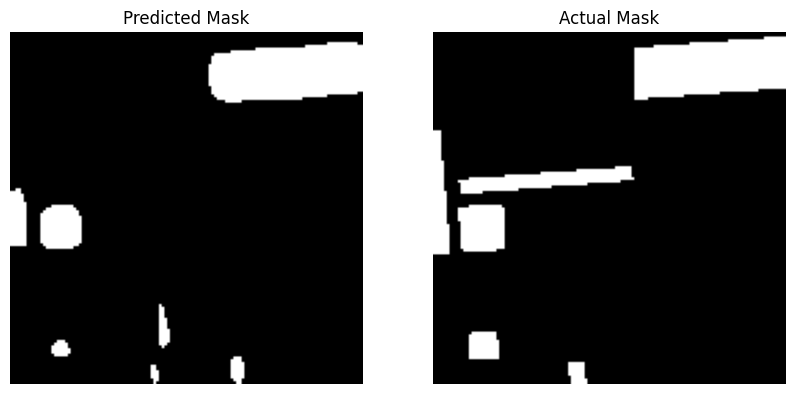

1/1 [==============================] - 0s 21ms/step


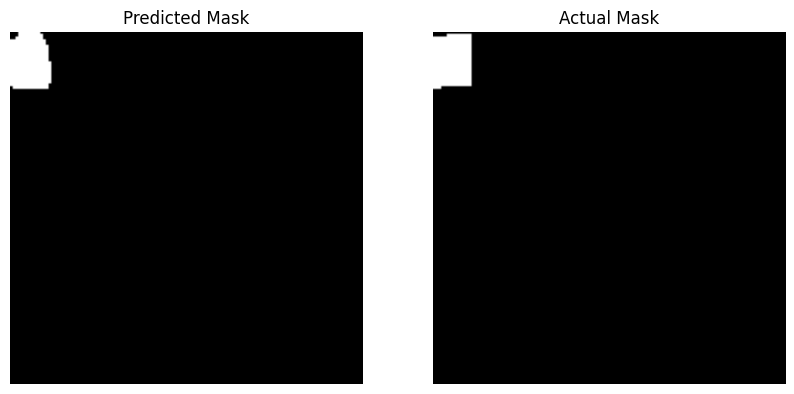

1/1 [==============================] - 0s 21ms/step


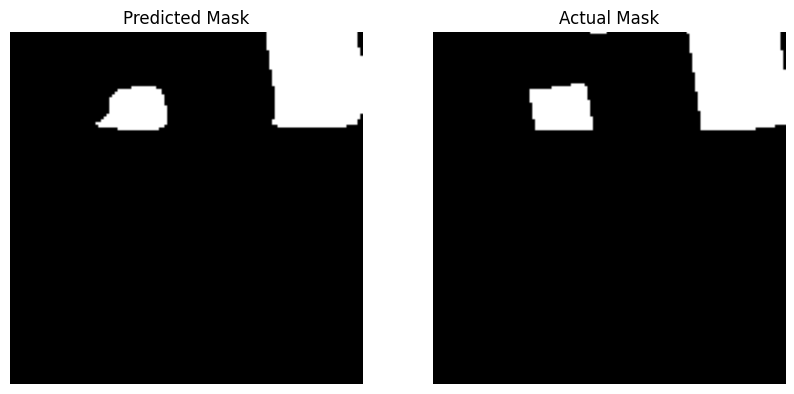

1/1 [==============================] - 0s 20ms/step


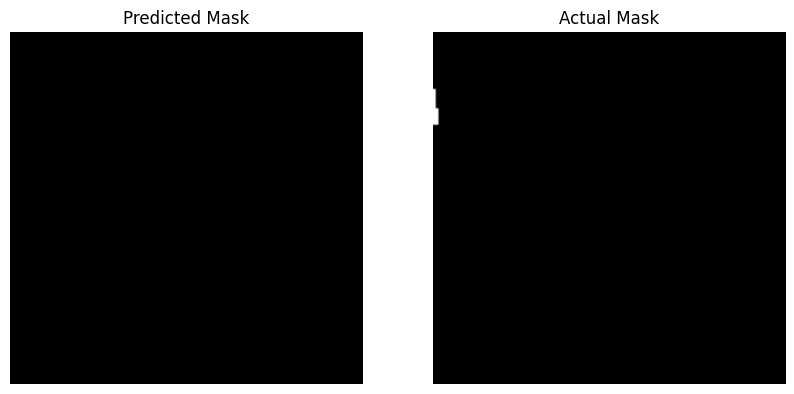

1/1 [==============================] - 0s 19ms/step


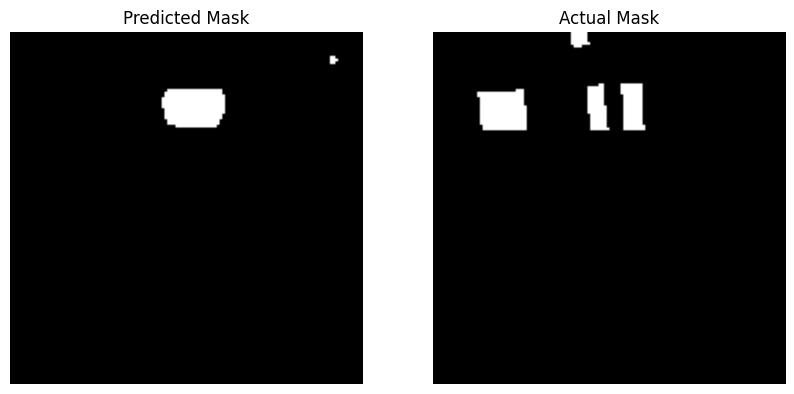

1/1 [==============================] - 0s 20ms/step


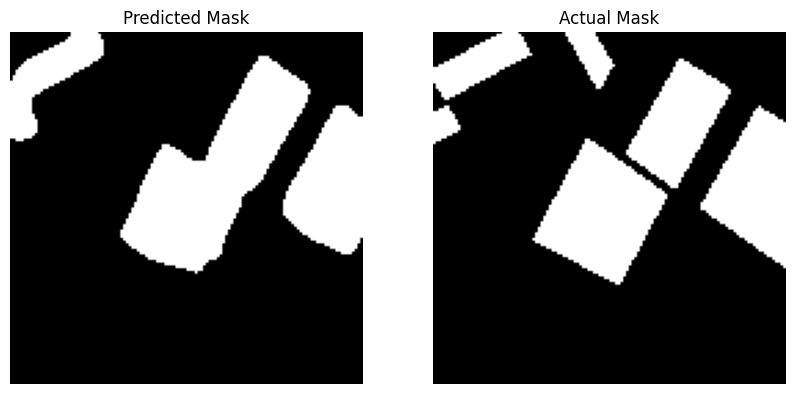

1/1 [==============================] - 0s 22ms/step


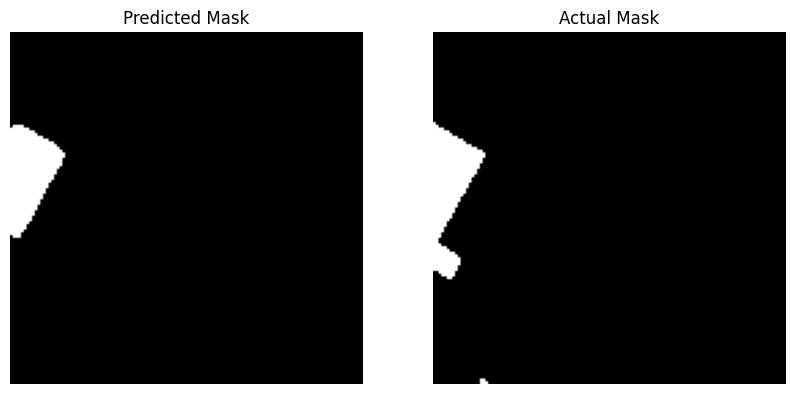

1/1 [==============================] - 0s 19ms/step


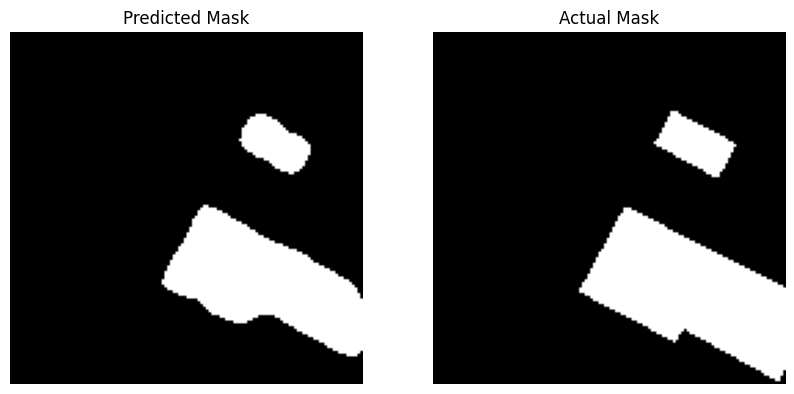

1/1 [==============================] - 0s 19ms/step


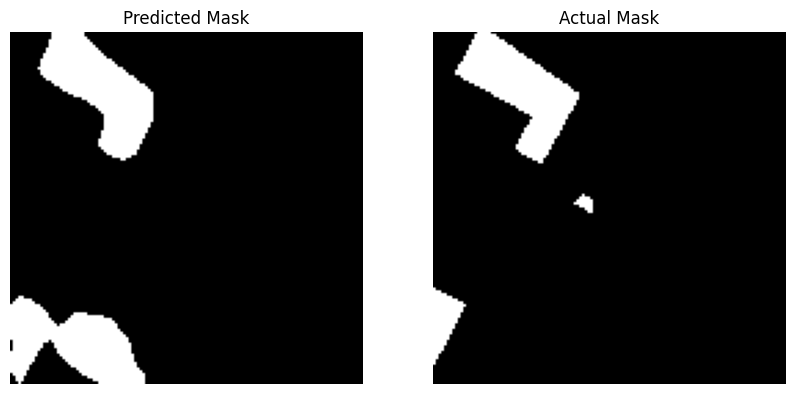

1/1 [==============================] - 0s 19ms/step


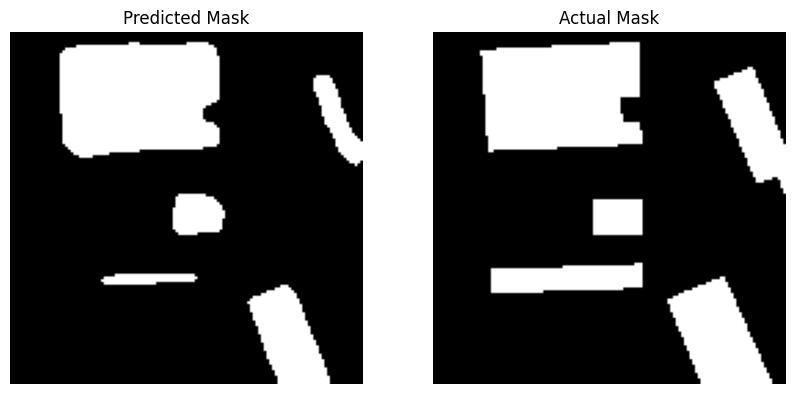

1/1 [==============================] - 0s 19ms/step


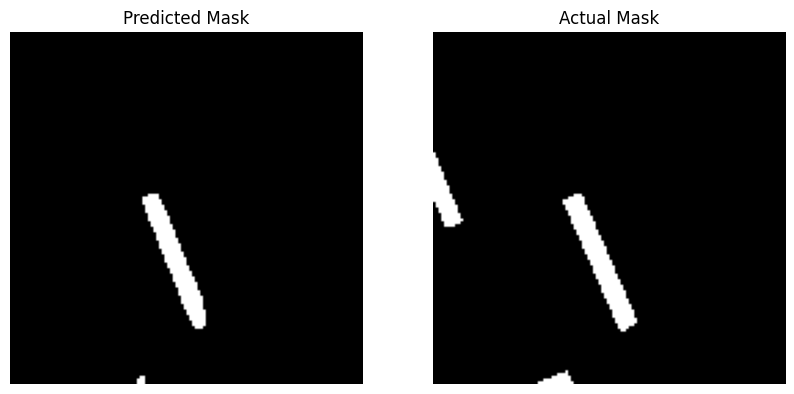

1/1 [==============================] - 0s 24ms/step


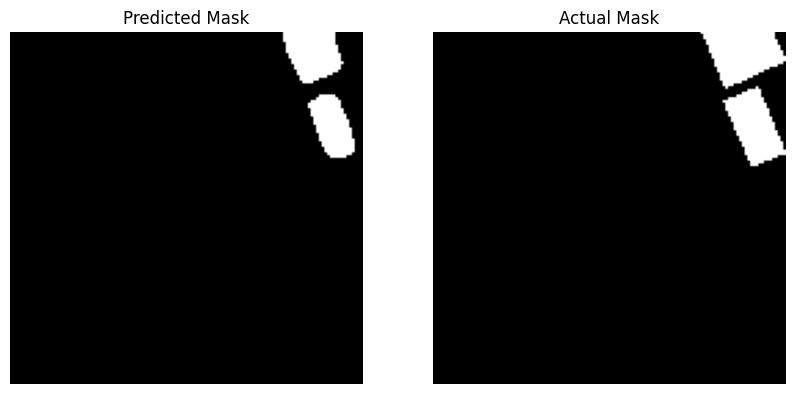

1/1 [==============================] - 0s 20ms/step


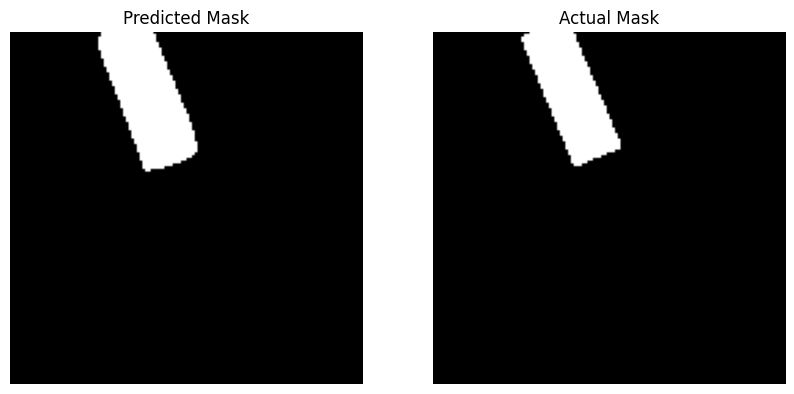

In [65]:
# Define the threshold for converting probability to binary mask
threshold = 0.5

# Loop over all images in the test set
for image_index in range(len(X_val_128)):
    input_image = X_val_128[image_index]
    actual_mask = y_val_128[image_index]
    input_image = np.expand_dims(input_image, axis=0)

    # Make prediction
    prediction = model_newUnet2.predict(input_image)

    # Threshold the probability map to get the binary mask
    predicted_mask = (prediction > threshold).astype(np.uint8)

    # Plot the predicted mask and the actual mask side by side
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(actual_mask[:, :, 0], cmap='gray')
    plt.title('Actual Mask')
    plt.axis('off')

    plt.show()

# 9. MODEL 2 - Attention UNET

In [39]:
# Attention Unet

import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model

def conv_block(x, num_filters):
    x = L.Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = L.BatchNormalization()(x)
    x = L.Activation("relu")(x)

    x = L.Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = L.BatchNormalization()(x)
    x = L.Activation("relu")(x)

    return x


def encoder_block(x, num_filters):
    x = conv_block(x, num_filters)
    p = L.MaxPool2D((2, 2))(x)
    return x, p

def attention_gate(g, s, num_filters):
    Wg = L.Conv2D(num_filters, 1, padding="same")(g)
    Wg = L.BatchNormalization()(Wg)

    Ws = L.Conv2D(num_filters, 1, padding="same")(s)
    Ws = L.BatchNormalization()(Ws)

    out = L.Activation("relu")(Wg + Ws)
    out = L.Conv2D(num_filters, 1, padding="same")(out)
    out = L.Activation("sigmoid")(out)

    return out * s

def decoder_block(x, s, num_filters):
    x = L.UpSampling2D(interpolation="bilinear")(x)
    s = attention_gate(x, s, num_filters)
    x = L.Concatenate()([x, s])
    x = conv_block(x, num_filters)
    return x

def attention_unet(input_shape):
    """ Inputs """
    inputs = L.Input(input_shape)

    """ Encoder """
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)

    b1 = conv_block(p3, 512)

    """ Decoder """
    d1 = decoder_block(b1, s3, 256)
    d2 = decoder_block(d1, s2, 128)
    d3 = decoder_block(d2, s1, 64)

    """ Outputs """
    outputs = L.Conv2D(1, 1, padding="same", activation="sigmoid")(d3)

    """ Model """
    model = Model(inputs, outputs, name="Attention-UNET")
    return model

if __name__ == "__main__":
    input_shape = (128, 128, 12)
    model_attention = attention_unet(input_shape)

model_attention.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])

history = model_attention.fit(X_train_128, y_train_128,
                    batch_size=16,
                    verbose=1,
                    epochs=100,
                    validation_data=(X_val_128, y_val_128),
                    shuffle=True)

Epoch 1/100
26/26 [==============================] - 46s 822ms/step - loss: 0.2845 - dice_coefficient: 0.5916 - val_loss: 383.3171 - val_dice_coefficient: 0.1698
Epoch 2/100
26/26 [==============================] - 7s 257ms/step - loss: 0.1371 - dice_coefficient: 0.7975 - val_loss: 8.6510 - val_dice_coefficient: 0.1316
Epoch 3/100
26/26 [==============================] - 7s 259ms/step - loss: 0.1121 - dice_coefficient: 0.8277 - val_loss: 0.2798 - val_dice_coefficient: 0.0012
Epoch 4/100
26/26 [==============================] - 7s 259ms/step - loss: 0.1002 - dice_coefficient: 0.8317 - val_loss: 0.3306 - val_dice_coefficient: 0.0011
Epoch 5/100
26/26 [==============================] - 7s 256ms/step - loss: 0.0927 - dice_coefficient: 0.8441 - val_loss: 0.3559 - val_dice_coefficient: 5.2061e-04
Epoch 6/100
26/26 [==============================] - 7s 256ms/step - loss: 0.0861 - dice_coefficient: 0.8541 - val_loss: 0.2598 - val_dice_coefficient: 0.1956
Epoch 7/100
26/26 [====================

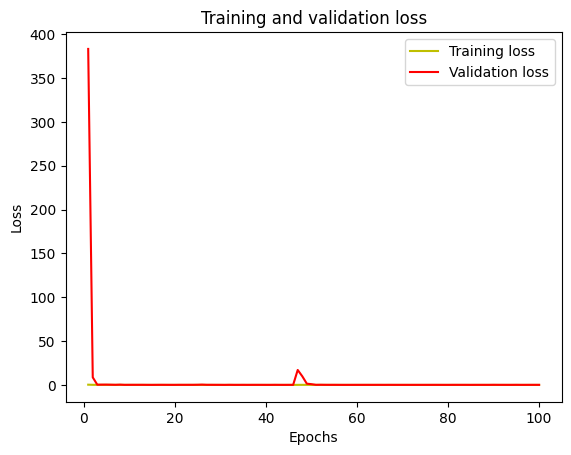

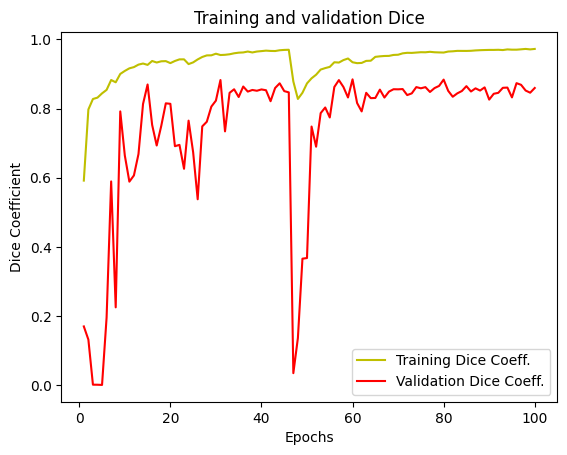

In [40]:
############################################################
#Evaluate the model
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


jc = history.history['dice_coefficient']
val_jc = history.history['val_dice_coefficient']

plt.plot(epochs, jc, 'y', label='Training Dice Coeff.')
plt.plot(epochs, val_jc, 'r', label='Validation Dice Coeff.')
plt.title('Training and validation Dice')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.show()



In [41]:
# Evaluate the model on the training set
train_loss, train_dice_coeff = model_attention.evaluate(X_train_128, y_train_128, verbose=0)

# Evaluate the model on the test set
val_loss, val_dice_coeff = model_attention.evaluate(X_val_128, y_val_128, verbose=0)

# Print the results
print("Training Loss:", train_loss)
print("Training Dice Coefficient:", train_dice_coeff)
print("Val Loss:", val_loss)
print("Val Dice Coefficient:", val_dice_coeff)

Training Loss: 0.013744756579399109
Training Dice Coefficient: 0.972925066947937
Val Loss: 0.09790726006031036
Val Dice Coefficient: 0.8595966100692749


1/1 [==============================] - 1s 1s/step


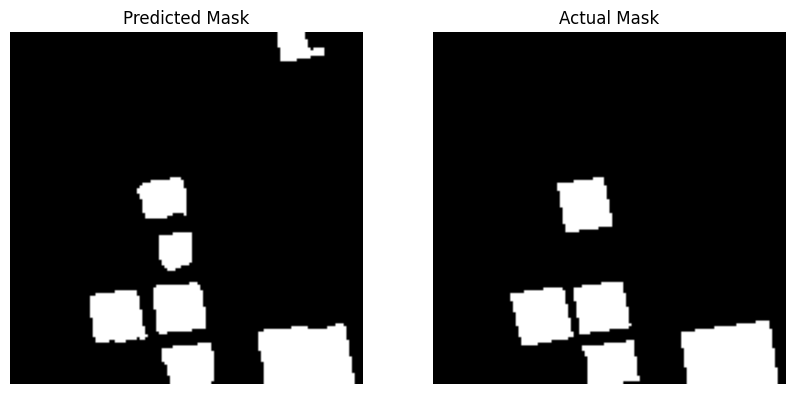

1/1 [==============================] - 0s 24ms/step


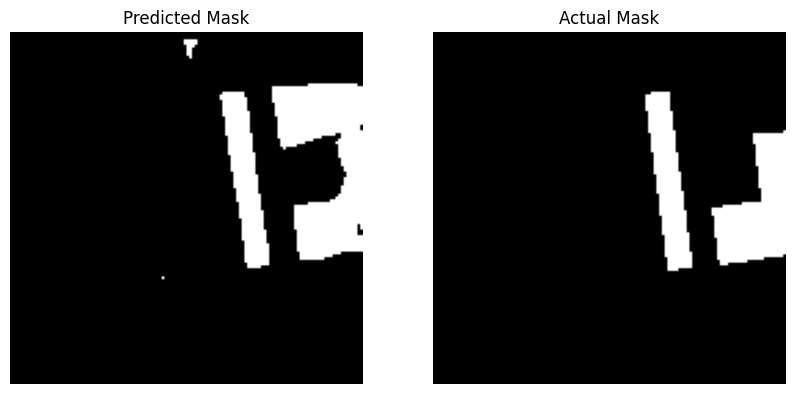

1/1 [==============================] - 0s 20ms/step


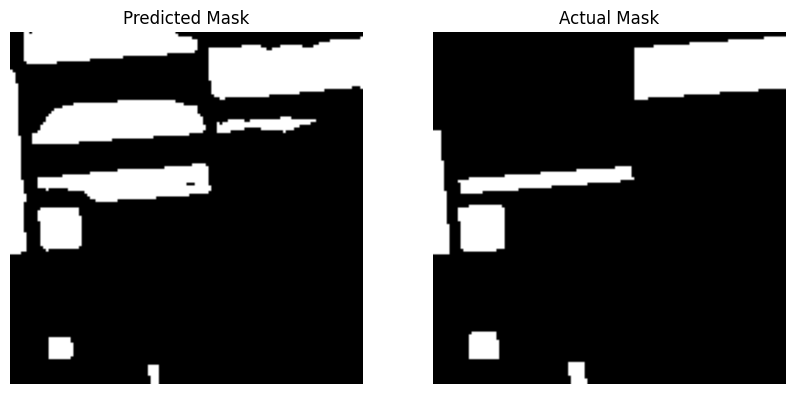

1/1 [==============================] - 0s 20ms/step


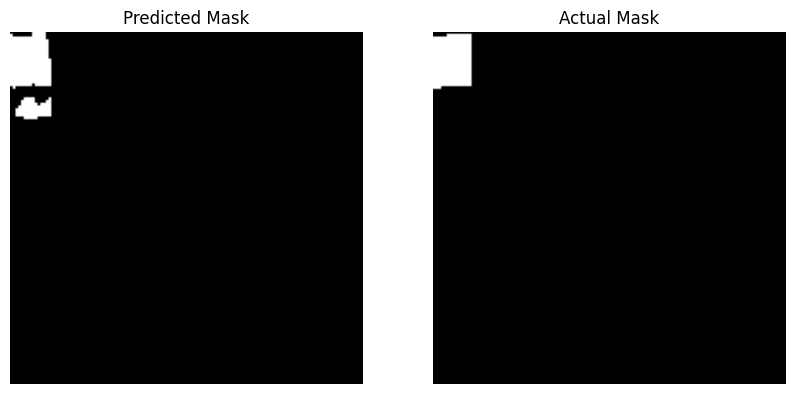

1/1 [==============================] - 0s 37ms/step


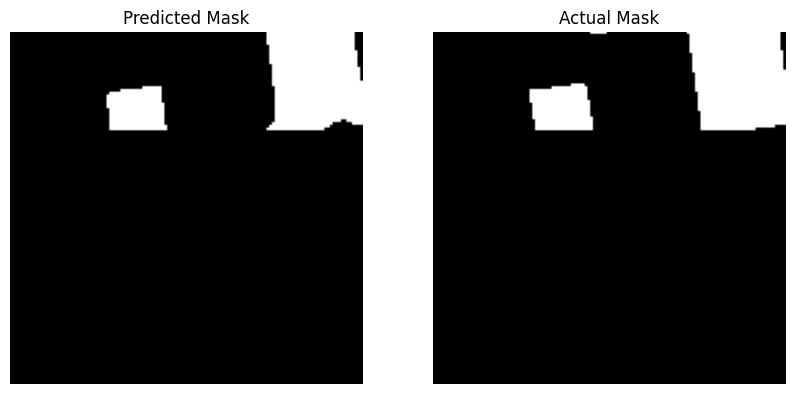

1/1 [==============================] - 0s 45ms/step


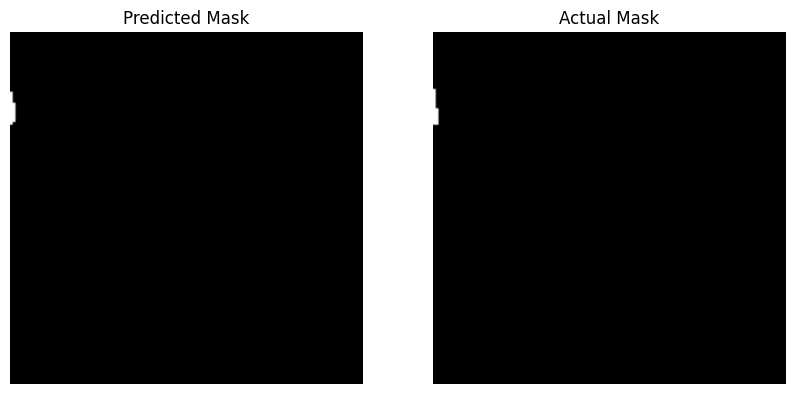

1/1 [==============================] - 0s 29ms/step


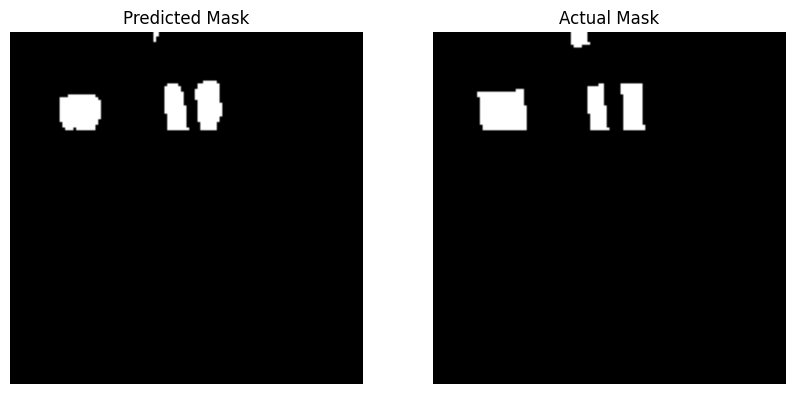

1/1 [==============================] - 0s 35ms/step


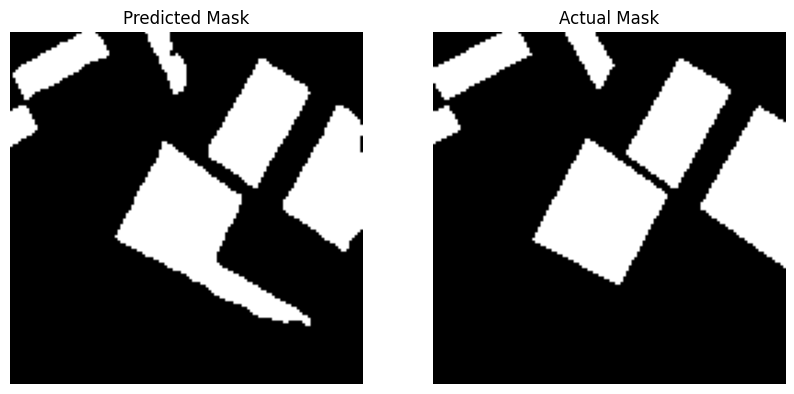

1/1 [==============================] - 0s 30ms/step


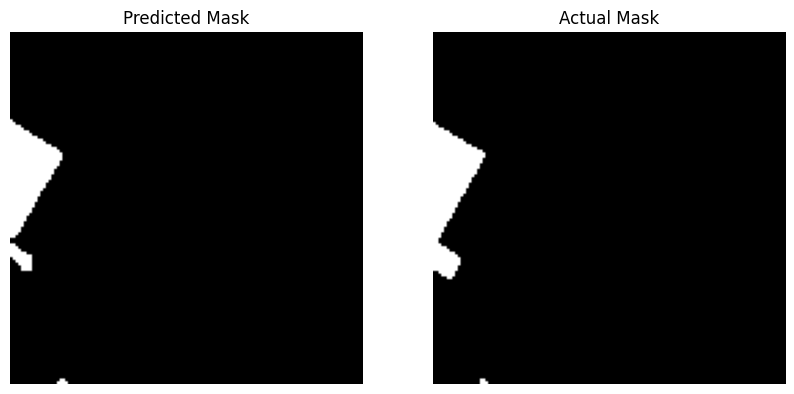

1/1 [==============================] - 0s 29ms/step


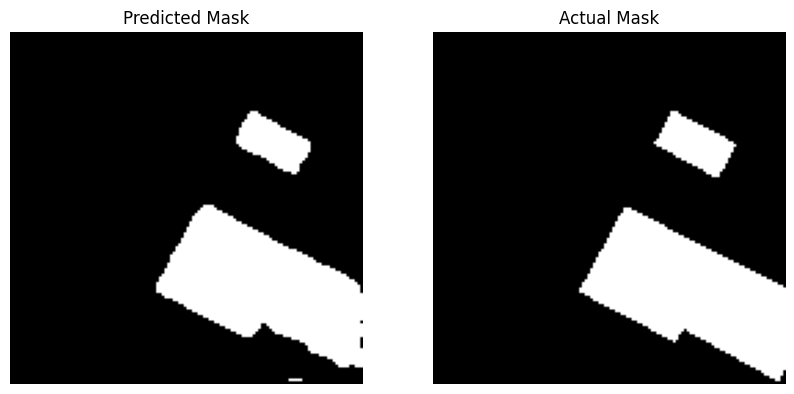

1/1 [==============================] - 0s 30ms/step


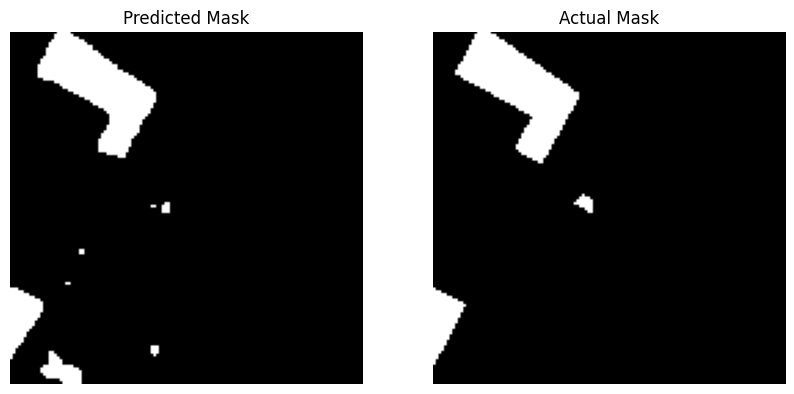

1/1 [==============================] - 0s 29ms/step


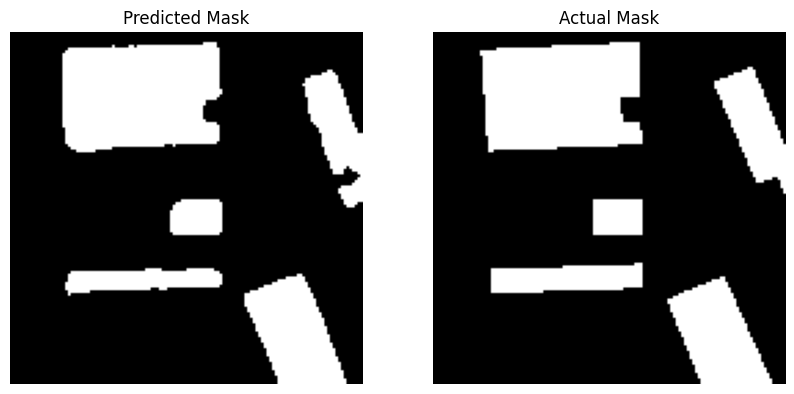

1/1 [==============================] - 0s 30ms/step


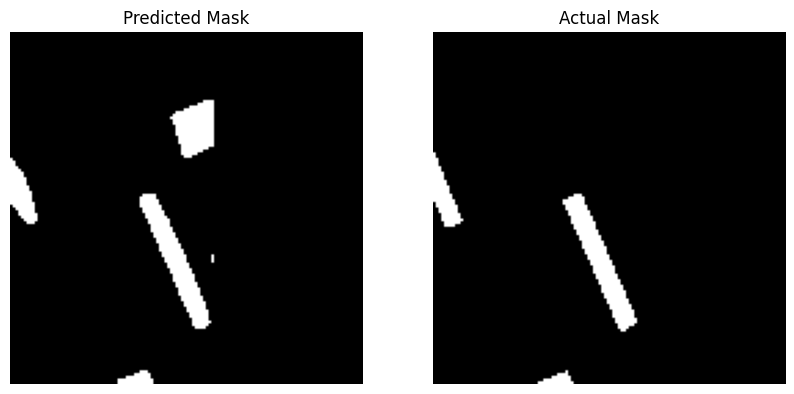

1/1 [==============================] - 0s 32ms/step


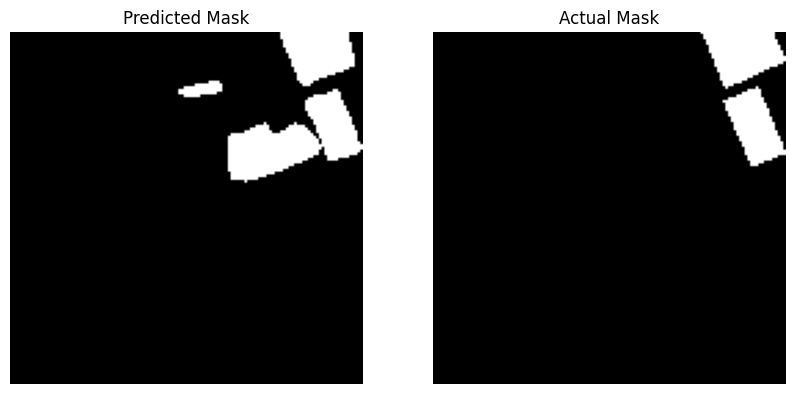

1/1 [==============================] - 0s 21ms/step


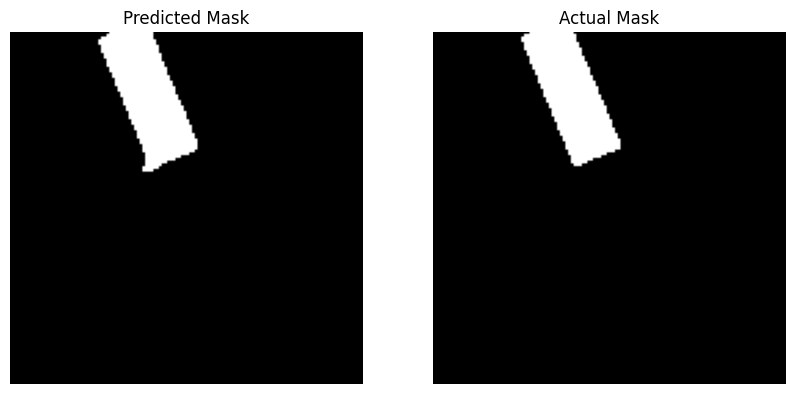

In [42]:
# Define the threshold for converting probability to binary mask
threshold = 0.5

# Function to save the outputs
def save_outputs(model_name, model, X_val, y_val):
    output_directory = os.path.join('output_images', model_name)
    os.makedirs(output_directory, exist_ok=True)

    # Loop over all images in the test set
    for image_index in range(len(X_val)):
        # Take the specific image and its corresponding mask from the test set
        input_image = X_val[image_index]
        actual_mask = y_val[image_index]

        # Expand dimensions to create a batch of size 1
        input_image = np.expand_dims(input_image, axis=0)

        # Make prediction
        prediction = model.predict(input_image)

        # Threshold the probability map to get the binary mask
        predicted_mask = (prediction > threshold).astype(np.uint8)

        # Save the predicted and actual mask images within the model subfolder
        plt.imsave(os.path.join(output_directory, f'predicted_mask_{image_index}.png'), predicted_mask[0, :, :, 0], cmap='gray')
        plt.imsave(os.path.join(output_directory, f'actual_mask_{image_index}.png'), actual_mask[:, :, 0], cmap='gray')

        # Plot the predicted mask and the actual mask side by side
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
        plt.title('Predicted Mask')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(actual_mask[:, :, 0], cmap='gray')
        plt.title('Actual Mask')
        plt.axis('off')

        plt.show()


# Run Attention UNet (Model 2)
save_outputs('Model2', model_attention, X_val_128, y_val_128)


## Handling Overfitting Issue

In [43]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping

def conv_block(x, num_filters):
    x = L.Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = L.BatchNormalization()(x)
    x = L.Activation("relu")(x)

    x = L.Conv2D(num_filters, 3, padding="same", kernel_initializer='he_normal')(x)
    x = L.BatchNormalization()(x)
    x = L.Activation("relu")(x)

    return x

def encoder_block(x, num_filters):
    x = conv_block(x, num_filters)
    p = L.MaxPool2D((2, 2))(x)
    return x, p

def attention_gate(g, s, num_filters):
    Wg = L.Conv2D(num_filters, 1, padding="same")(g)
    Wg = L.BatchNormalization()(Wg)

    Ws = L.Conv2D(num_filters, 1, padding="same")(s)
    Ws = L.BatchNormalization()(Ws)

    out = L.Activation("relu")(Wg + Ws)
    out = L.Conv2D(num_filters, 1, padding="same")(out)
    out = L.Activation("sigmoid")(out)

    return out * s

def decoder_block(x, s, num_filters):
    x = L.UpSampling2D(interpolation="bilinear")(x)
    s = attention_gate(x, s, num_filters)
    x = L.Concatenate()([x, s])
    x = conv_block(x, num_filters)
    return x

def attention_unet(input_shape, dropout_rate=0.3, l2_lambda=0.01):
    """ Inputs """
    inputs = L.Input(input_shape)

    """ Encoder """
    s1, p1 = encoder_block(inputs, 64)
    s2, p2 = encoder_block(p1, 128)
    s3, p3 = encoder_block(p2, 256)

    b1 = conv_block(p3, 512)

    """ Decoder """
    d1 = decoder_block(b1, s3, 256)
    d2 = decoder_block(d1, s2, 128)
    d3 = decoder_block(d2, s1, 64)

    """ Outputs """
    outputs = L.Conv2D(1, 1, padding="same", activation="sigmoid", kernel_regularizer=tf.keras.regularizers.l2(l2_lambda))(d3)

    """ Model """
    model = Model(inputs, outputs, name="Attention-UNET")

    # Apply dropout to some layers
    model = tf.keras.Sequential([
        L.Dropout(dropout_rate),
        model
    ])

    return model

if __name__ == "__main__":
    input_shape = (128, 128, 12)
    model_attention_1 = attention_unet(input_shape, dropout_rate=0.2, l2_lambda=0.01)

    model_attention_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])

    # Define early stopping callback
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    history = model_attention_1.fit(X_train_128, y_train_128,
                                    batch_size=16,
                                    verbose=1,
                                    epochs=100,
                                    validation_data=(X_val_128, y_val_128),
                                    shuffle=True,
                                    callbacks=[early_stopping])

Epoch 1/100
26/26 [==============================] - 23s 315ms/step - loss: 0.3540 - dice_coefficient: 0.4819 - val_loss: 361.7369 - val_dice_coefficient: 0.1700
Epoch 2/100
26/26 [==============================] - 7s 264ms/step - loss: 0.1945 - dice_coefficient: 0.7091 - val_loss: 9.0059 - val_dice_coefficient: 0.1704
Epoch 3/100
26/26 [==============================] - 7s 268ms/step - loss: 0.1583 - dice_coefficient: 0.7743 - val_loss: 0.6616 - val_dice_coefficient: 0.1110
Epoch 4/100
26/26 [==============================] - 7s 266ms/step - loss: 0.1476 - dice_coefficient: 0.7877 - val_loss: 0.5697 - val_dice_coefficient: 0.1464
Epoch 5/100
26/26 [==============================] - 7s 262ms/step - loss: 0.1418 - dice_coefficient: 0.8019 - val_loss: 0.2205 - val_dice_coefficient: 0.5813
Epoch 6/100
26/26 [==============================] - 7s 262ms/step - loss: 0.1353 - dice_coefficient: 0.8054 - val_loss: 0.2149 - val_dice_coefficient: 0.6309
Epoch 7/100
26/26 [========================

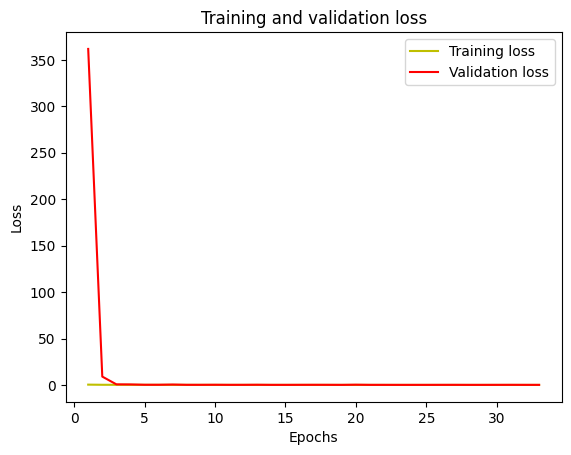

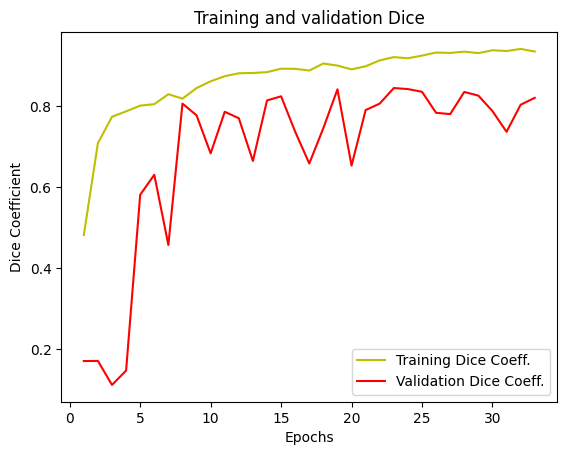

In [44]:
############################################################
#Evaluate the model

loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


jc = history.history['dice_coefficient']
val_jc = history.history['val_dice_coefficient']

plt.plot(epochs, jc, 'y', label='Training Dice Coeff.')
plt.plot(epochs, val_jc, 'r', label='Validation Dice Coeff.')
plt.title('Training and validation Dice')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.show()

In [45]:
# Evaluate the model on the training set
train_loss, train_dice_coeff = model_attention_1.evaluate(X_train_128, y_train_128, verbose=0)

# Evaluate the model on the test set
val_loss, val_dice_coeff = model_attention_1.evaluate(X_val_128, y_val_128, verbose=0)

# Print the results
print("Training Loss:", train_loss)
print("Training Dice Coefficient:", train_dice_coeff)
print("Val Loss:", val_loss)
print("Val Dice Coefficient:", val_dice_coeff)

Training Loss: 0.0997893214225769
Training Dice Coefficient: 0.8652004599571228
Val Loss: 0.09343990683555603
Val Dice Coefficient: 0.845409095287323


1/1 [==============================] - 0s 409ms/step


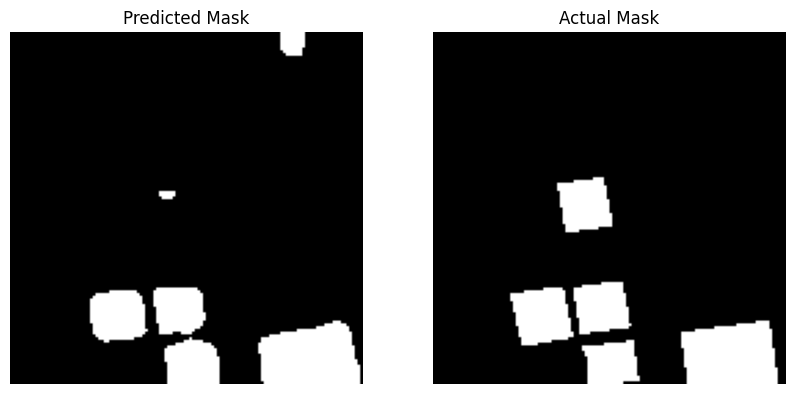

1/1 [==============================] - 0s 28ms/step


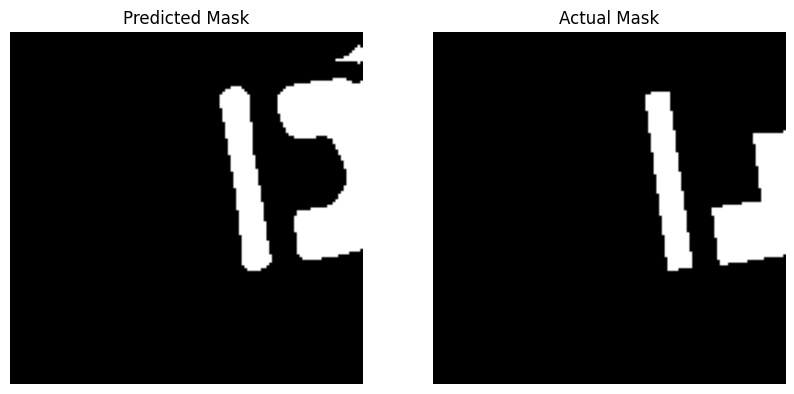

1/1 [==============================] - 0s 22ms/step


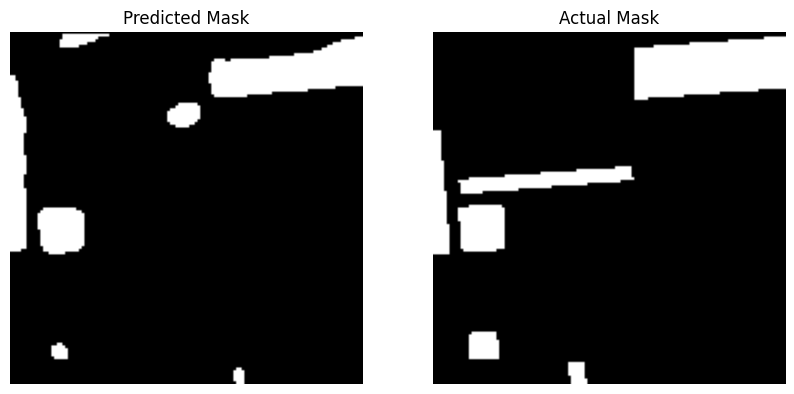

1/1 [==============================] - 0s 20ms/step


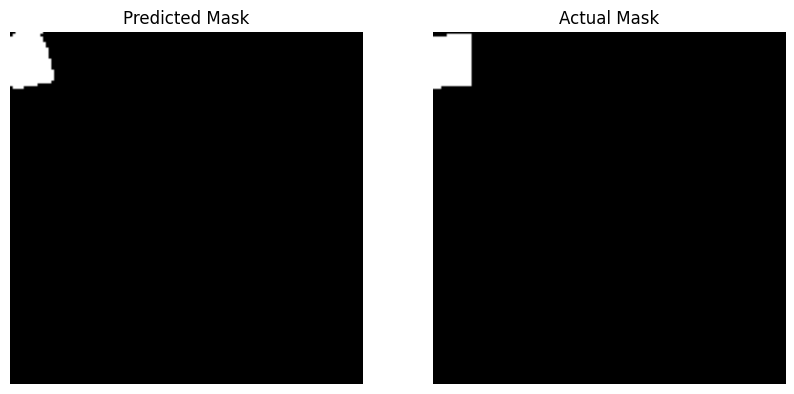

1/1 [==============================] - 0s 20ms/step


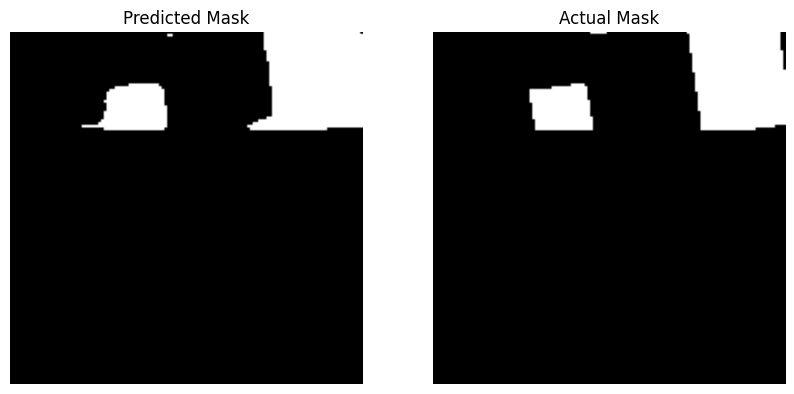

1/1 [==============================] - 0s 22ms/step


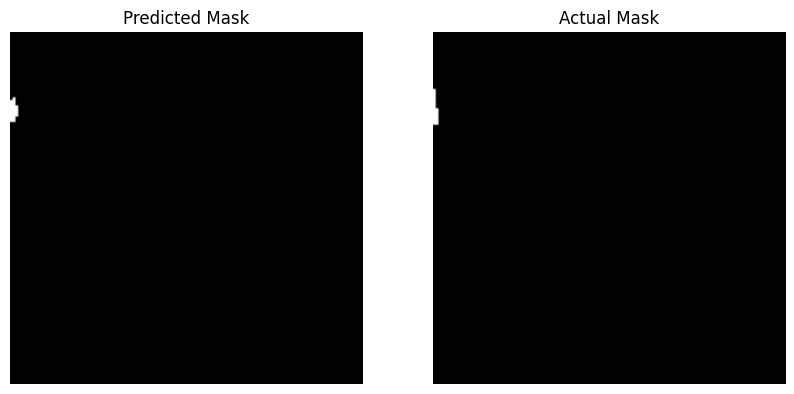

1/1 [==============================] - 0s 20ms/step


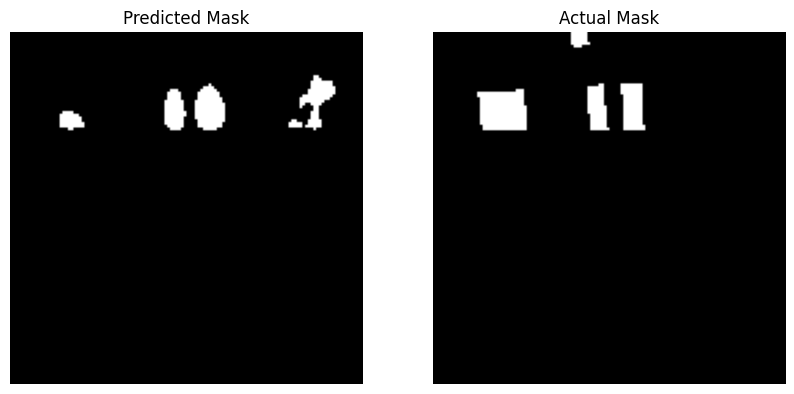

1/1 [==============================] - 0s 21ms/step


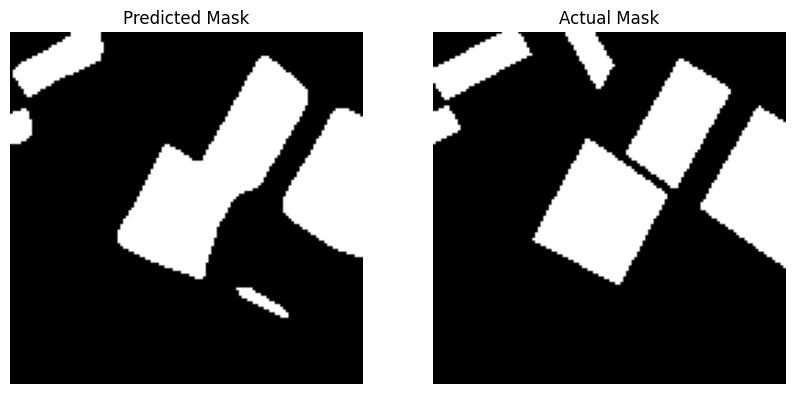

1/1 [==============================] - 0s 23ms/step


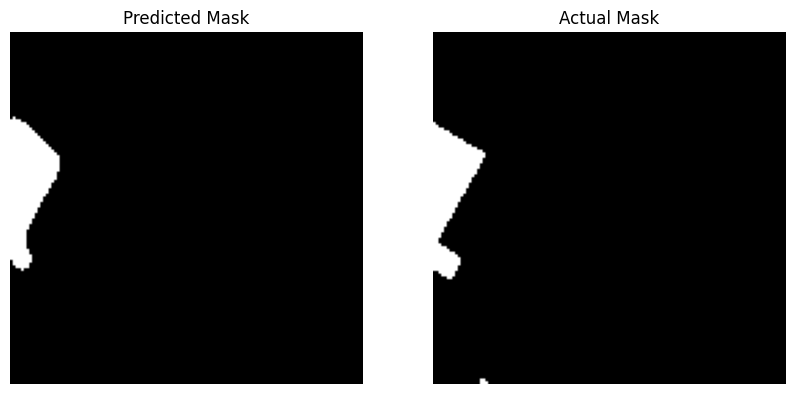

1/1 [==============================] - 0s 22ms/step


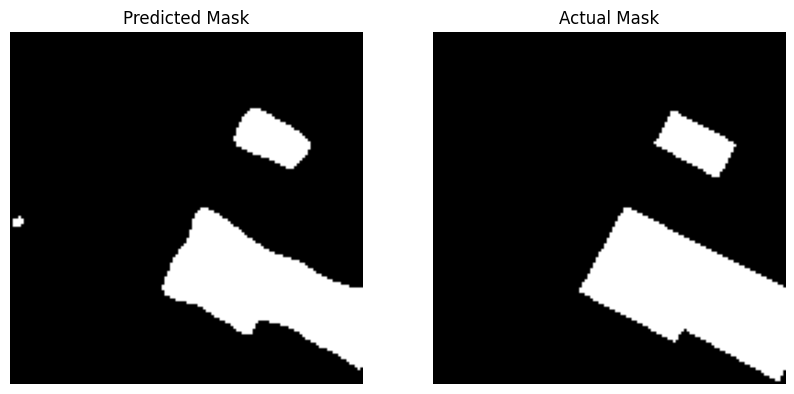

1/1 [==============================] - 0s 21ms/step


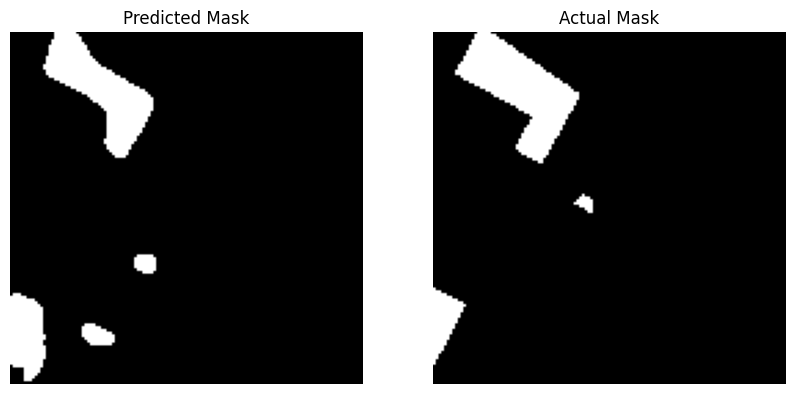

1/1 [==============================] - 0s 22ms/step


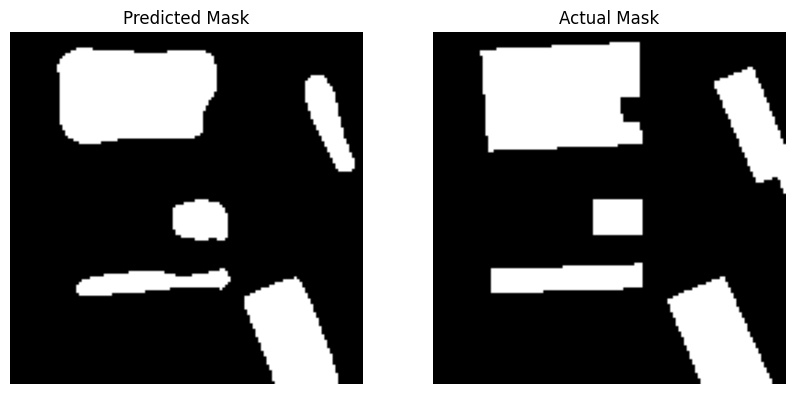

1/1 [==============================] - 0s 23ms/step


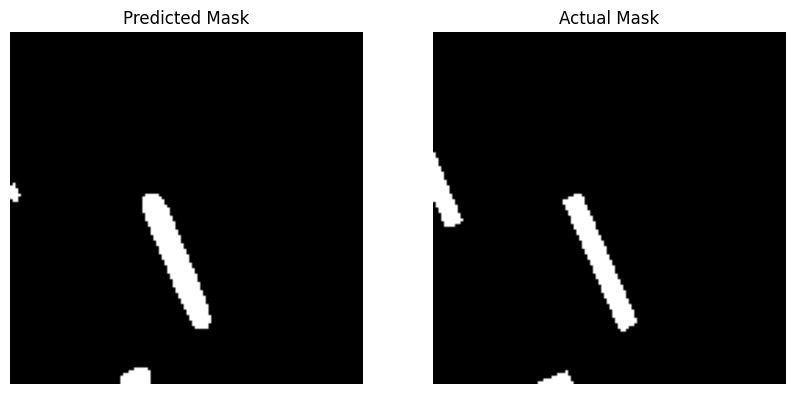

1/1 [==============================] - 0s 21ms/step


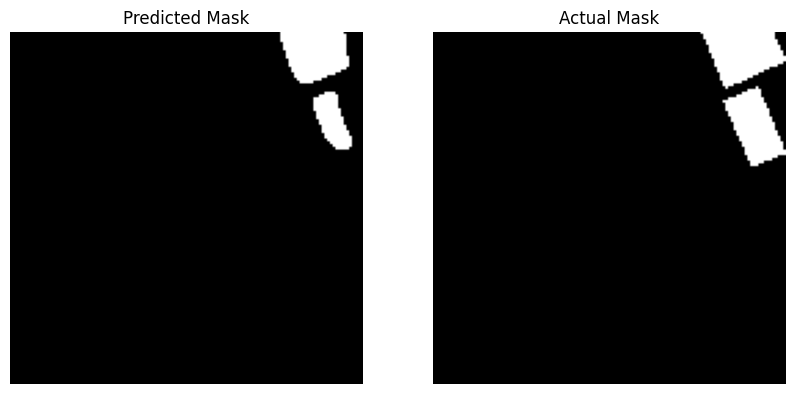

1/1 [==============================] - 0s 35ms/step


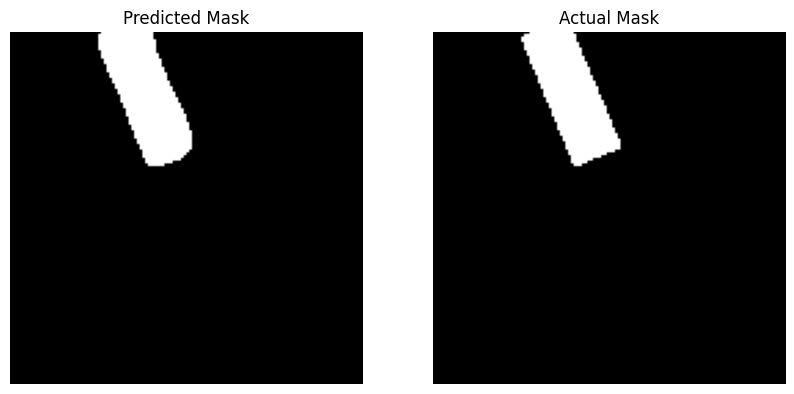

In [46]:
# Define the threshold for converting probability to binary mask
threshold = 0.5

# Loop over all images in the test set
for image_index in range(len(X_val_128)):
    input_image = X_val_128[image_index]
    actual_mask = y_val_128[image_index]
    input_image = np.expand_dims(input_image, axis=0)

    # Make prediction
    prediction = model_attention_1.predict(input_image)

    # Threshold the probability map to get the binary mask
    predicted_mask = (prediction > threshold).astype(np.uint8)

    # Plot the predicted mask and the actual mask side by side
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(actual_mask[:, :, 0], cmap='gray')
    plt.title('Actual Mask')
    plt.axis('off')

    plt.show()

# 10. MODEL 3 - RESUNET

In [47]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model

def bn_act(x, act=True):
    x = L.BatchNormalization()(x)
    if act == True:
        x = L.Activation("relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = bn_act(x)
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal')(conv)
    return conv

def stem(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip):
    u = L.UpSampling2D((2, 2))(x)
    c = L.Concatenate()([u, xskip])
    return c

image_size = 128
def ResUNet():
    f = [16, 32, 64, 128, 256]
    inputs = L.Input((image_size, image_size, 12))

    ## Encoder
    e0 = inputs
    e1 = stem(e0, f[0])
    e2 = residual_block(e1, f[1], strides=2)
    e3 = residual_block(e2, f[2], strides=2)
    e4 = residual_block(e3, f[3], strides=2)
    e5 = residual_block(e4, f[4], strides=2)

    ## Bridge
    b0 = conv_block(e5, f[4], strides=1)
    b1 = conv_block(b0, f[4], strides=1)

    ## Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, f[4])

    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, f[3])

    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, f[2])

    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, f[1])

    outputs = L.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = Model(inputs, outputs)
    return model

if __name__ == "__main__":
    input_shape = (128, 128, 12)
    model_ResUnet = ResUNet()
    model_ResUnet.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])

    history = model_ResUnet.fit(X_train_128, y_train_128,
                                batch_size=16,
                                verbose=1,
                                epochs=100,
                                validation_data=(X_val_128, y_val_128),
                                shuffle=True)

Epoch 1/100
26/26 [==============================] - 33s 339ms/step - loss: 0.2389 - dice_coefficient: 0.5256 - val_loss: 172.3881 - val_dice_coefficient: 0.0000e+00
Epoch 2/100
26/26 [==============================] - 3s 108ms/step - loss: 0.1206 - dice_coefficient: 0.7737 - val_loss: 2.7767 - val_dice_coefficient: 0.0132
Epoch 3/100
26/26 [==============================] - 3s 109ms/step - loss: 0.0842 - dice_coefficient: 0.8478 - val_loss: 0.6905 - val_dice_coefficient: 0.0221
Epoch 4/100
26/26 [==============================] - 3s 112ms/step - loss: 0.0711 - dice_coefficient: 0.8733 - val_loss: 0.6028 - val_dice_coefficient: 0.0575
Epoch 5/100
26/26 [==============================] - 3s 108ms/step - loss: 0.0566 - dice_coefficient: 0.8983 - val_loss: 0.4902 - val_dice_coefficient: 0.1138
Epoch 6/100
26/26 [==============================] - 3s 109ms/step - loss: 0.0521 - dice_coefficient: 0.9059 - val_loss: 0.5518 - val_dice_coefficient: 0.1745
Epoch 7/100
26/26 [====================

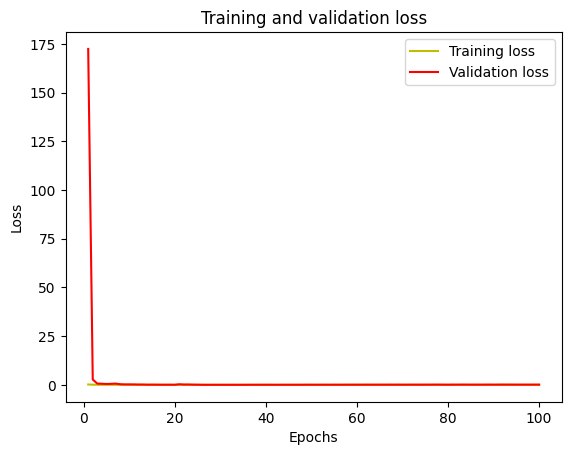

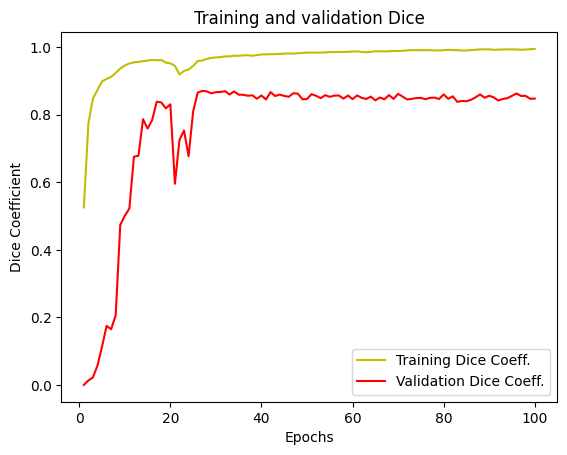

In [48]:
############################################################
#Evaluate the model

loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


jc = history.history['dice_coefficient']
val_jc = history.history['val_dice_coefficient']

plt.plot(epochs, jc, 'y', label='Training Dice Coeff.')
plt.plot(epochs, val_jc, 'r', label='Validation Dice Coeff.')
plt.title('Training and validation Dice')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.show()

In [49]:
# Evaluate the model on the training set
train_loss, train_dice_coeff = model_ResUnet.evaluate(X_train_128, y_train_128, verbose=0)

# Evaluate the model on the test set
val_loss, val_dice_coeff = model_ResUnet.evaluate(X_val_128, y_val_128, verbose=0)

# Print the results
print("Training Loss:", train_loss)
print("Training Dice Coefficient:", train_dice_coeff)
print("Val Loss:", val_loss)
print("Val Dice Coefficient:", val_dice_coeff)

Training Loss: 0.0027231990825384855
Training Dice Coefficient: 0.9952132105827332
Val Loss: 0.1696496307849884
Val Dice Coefficient: 0.8476818203926086


## Handling Overfitting Problem

In [50]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping


def bn_act(x, act=True):
    x = L.BatchNormalization()(x)
    if act == True:
        x = L.Activation("relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = bn_act(x)
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal')(conv)
    return conv

def stem(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip):
    u = L.UpSampling2D((2, 2))(x)
    c = L.Concatenate()([u, xskip])
    return c

image_size = 128
def ResUNet():
    f = [16, 32, 64, 128, 256]
    inputs = L.Input((image_size, image_size, 12))

    ## Encoder
    e0 = inputs
    e1 = stem(e0, f[0])
    e2 = residual_block(e1, f[1], strides=2)
    e3 = residual_block(e2, f[2], strides=2)
    e4 = residual_block(e3, f[3], strides=2)
    e5 = residual_block(e4, f[4], strides=2)

    ## Bridge
    b0 = conv_block(e5, f[4], strides=1)
    b1 = conv_block(b0, f[4], strides=1)

    ## Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, f[4])

    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, f[3])

    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, f[2])

    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, f[1])

    # Add dropout layers
    d1 = L.Dropout(0.2)(d1)
    d2 = L.Dropout(0.2)(d2)
    d3 = L.Dropout(0.2)(d3)
    d4 = L.Dropout(0.2)(d4)

    outputs = L.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = Model(inputs, outputs)
    return model

if __name__ == "__main__":
    input_shape = (128, 128, 12)
    model_ResUnet01 = ResUNet()
    model_ResUnet01.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])
    # Define EarlyStopping callback
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )
    history = model_ResUnet01.fit(X_train_128, y_train_128,
                                batch_size=16,
                                verbose=1,
                                epochs=100,
                                validation_data=(X_val_128, y_val_128),
                                shuffle=True,callbacks=[early_stopping])

Epoch 1/100
26/26 [==============================] - 25s 168ms/step - loss: 0.2538 - dice_coefficient: 0.5529 - val_loss: 37.0459 - val_dice_coefficient: 0.0285
Epoch 2/100
26/26 [==============================] - 4s 138ms/step - loss: 0.1074 - dice_coefficient: 0.7963 - val_loss: 2.8896 - val_dice_coefficient: 0.2201
Epoch 3/100
26/26 [==============================] - 4s 139ms/step - loss: 0.0779 - dice_coefficient: 0.8559 - val_loss: 0.3869 - val_dice_coefficient: 0.0914
Epoch 4/100
26/26 [==============================] - 4s 140ms/step - loss: 0.0676 - dice_coefficient: 0.8785 - val_loss: 0.4441 - val_dice_coefficient: 0.1081
Epoch 5/100
26/26 [==============================] - 4s 137ms/step - loss: 0.0623 - dice_coefficient: 0.8863 - val_loss: 0.4779 - val_dice_coefficient: 0.0137
Epoch 6/100
26/26 [==============================] - 4s 137ms/step - loss: 0.0514 - dice_coefficient: 0.9053 - val_loss: 0.4397 - val_dice_coefficient: 0.2537
Epoch 7/100
26/26 [=========================

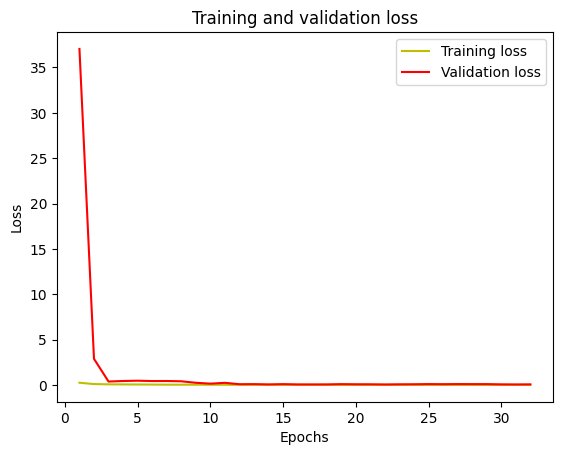

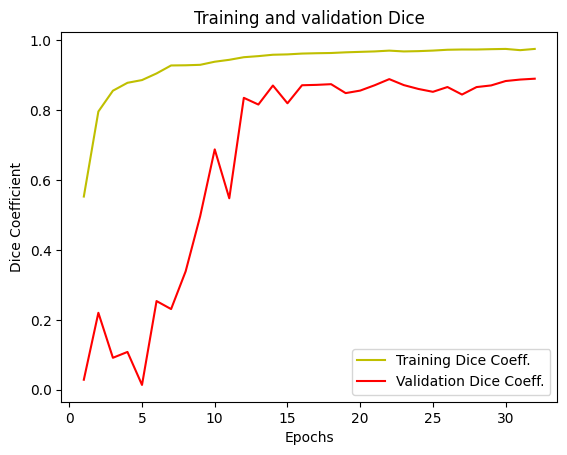

In [51]:
############################################################
#Evaluate the model

loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


jc = history.history['dice_coefficient']
val_jc = history.history['val_dice_coefficient']

plt.plot(epochs, jc, 'y', label='Training Dice Coeff.')
plt.plot(epochs, val_jc, 'r', label='Validation Dice Coeff.')
plt.title('Training and validation Dice')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.show()

In [52]:
# Evaluate the model on the training set
train_loss, train_dice_coeff = model_ResUnet01.evaluate(X_train_128, y_train_128, verbose=0)

# Evaluate the model on the test set
val_loss, val_dice_coeff = model_ResUnet01.evaluate(X_val_128, y_val_128, verbose=0)

# Print the results
print("Training Loss:", train_loss)
print("Training Dice Coefficient:", train_dice_coeff)
print("Val Loss:", val_loss)
print("Val Dice Coefficient:", val_dice_coeff)

Training Loss: 0.01806512475013733
Training Dice Coefficient: 0.9664067029953003
Val Loss: 0.06391767412424088
Val Dice Coefficient: 0.8890077471733093


1/1 [==============================] - 2s 2s/step


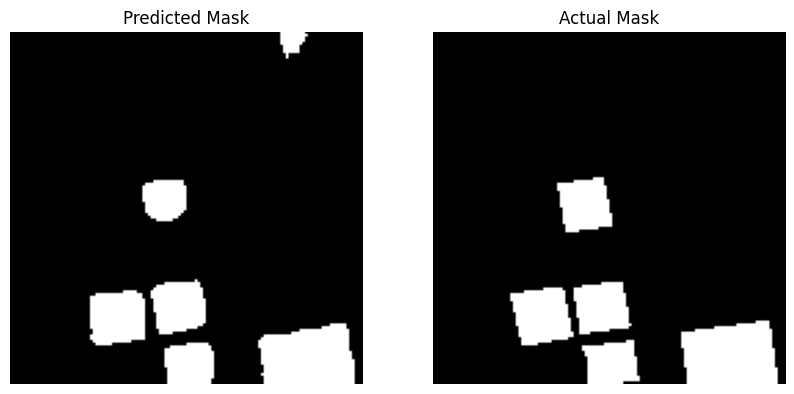

1/1 [==============================] - 0s 45ms/step


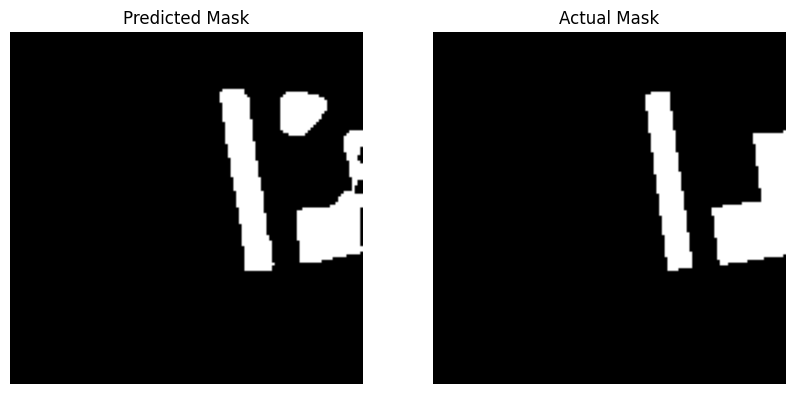

1/1 [==============================] - 0s 39ms/step


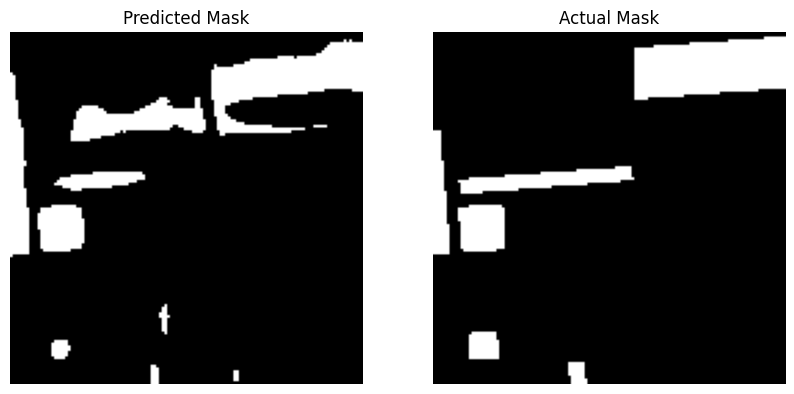

1/1 [==============================] - 0s 64ms/step


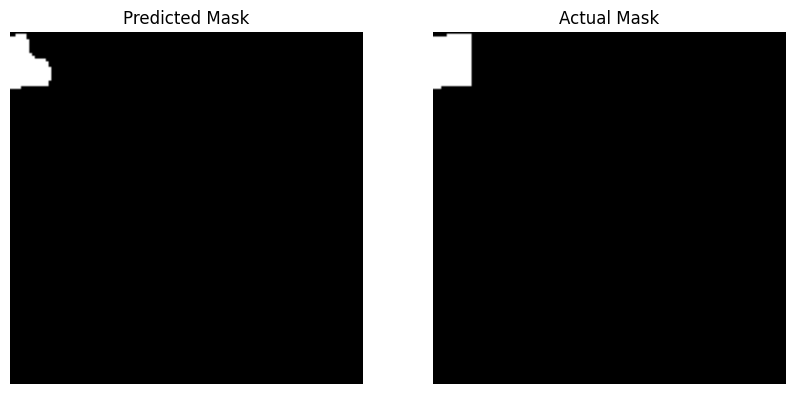

1/1 [==============================] - 0s 41ms/step


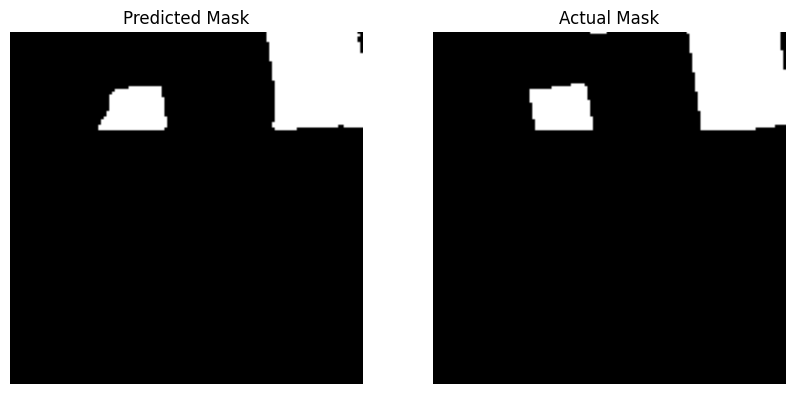

1/1 [==============================] - 0s 43ms/step


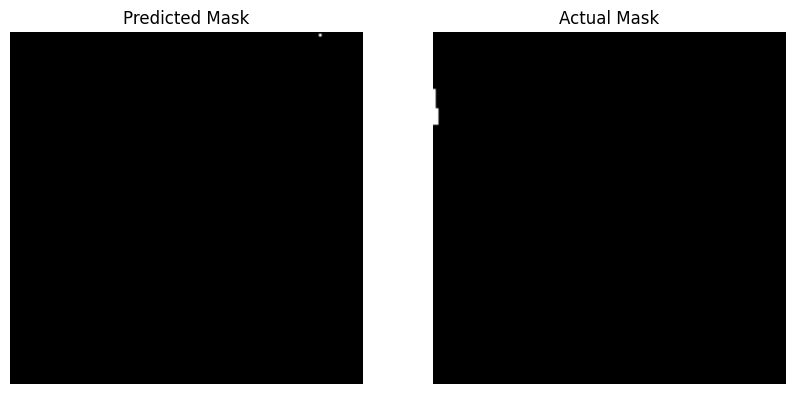

1/1 [==============================] - 0s 33ms/step


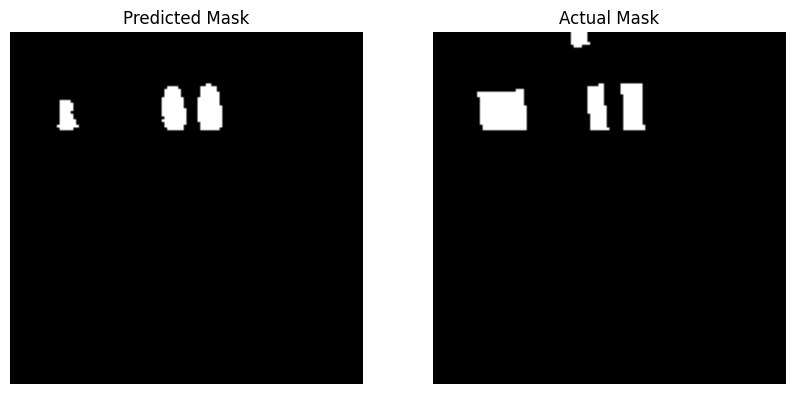

1/1 [==============================] - 0s 30ms/step


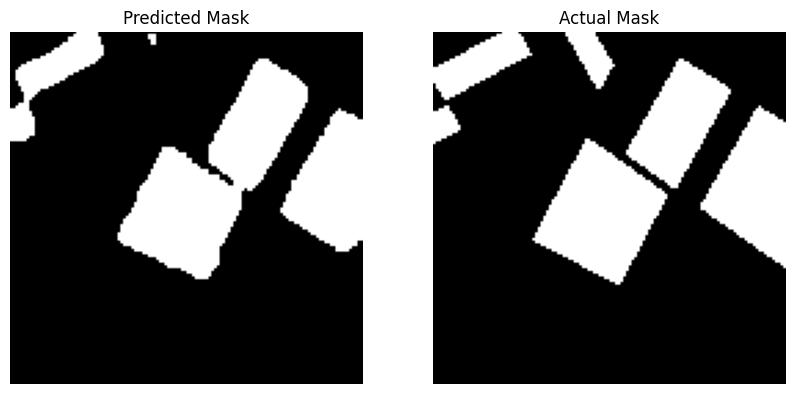

1/1 [==============================] - 0s 31ms/step


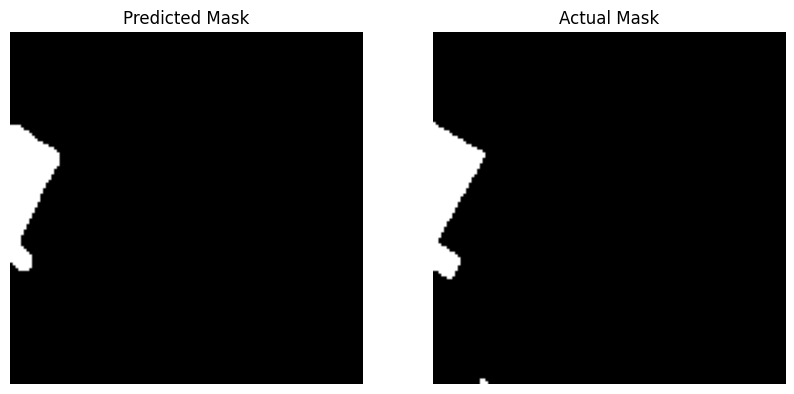

1/1 [==============================] - 0s 30ms/step


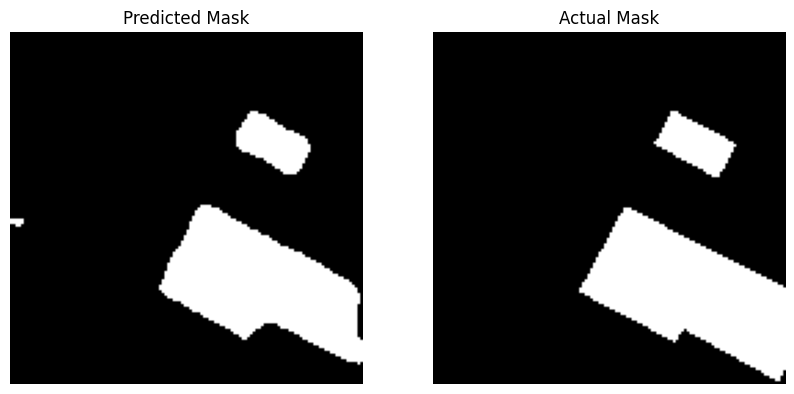

1/1 [==============================] - 0s 21ms/step


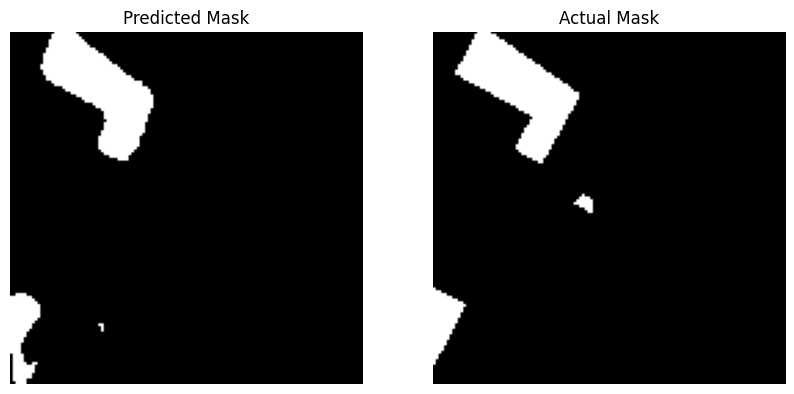

1/1 [==============================] - 0s 21ms/step


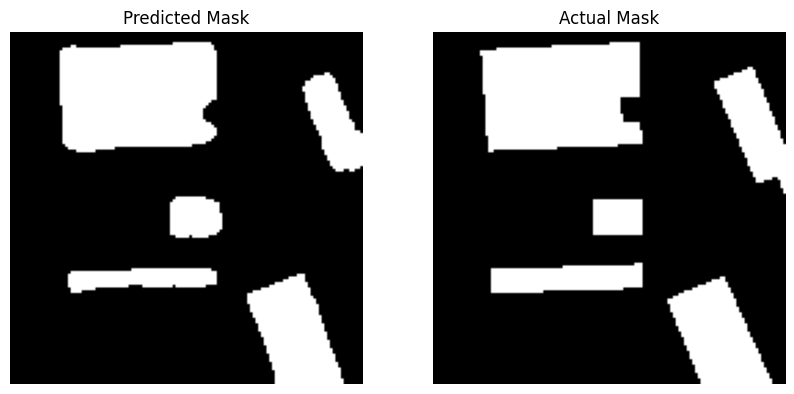

1/1 [==============================] - 0s 21ms/step


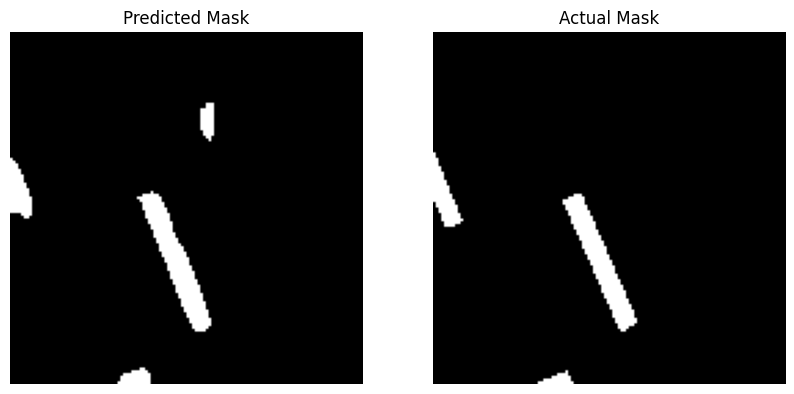

1/1 [==============================] - 0s 24ms/step


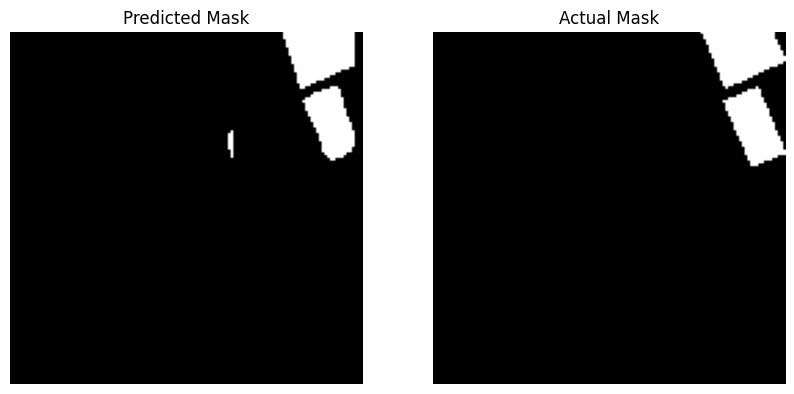

1/1 [==============================] - 0s 20ms/step


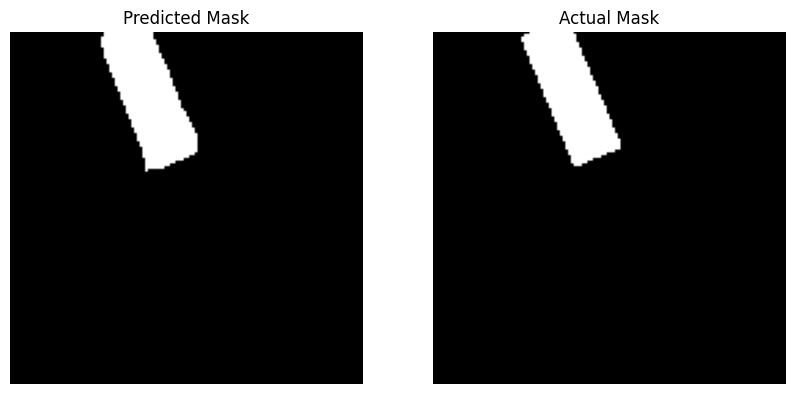

In [53]:
# Define the threshold for converting probability to binary mask
threshold = 0.5

for image_index in range(len(X_val_128)):
    input_image = X_val_128[image_index]
    actual_mask = y_val_128[image_index]
    input_image = np.expand_dims(input_image, axis=0)

    # Make prediction
    prediction = model_ResUnet01.predict(input_image)

    # Threshold the probability map to get the binary mask
    predicted_mask = (prediction > threshold).astype(np.uint8)

    # Plot the predicted mask and the actual mask side by side
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(actual_mask[:, :, 0], cmap='gray')
    plt.title('Actual Mask')
    plt.axis('off')

    plt.show()


# 11. Visual Comparision of Models

1/1 [==============================] - 0s 22ms/step


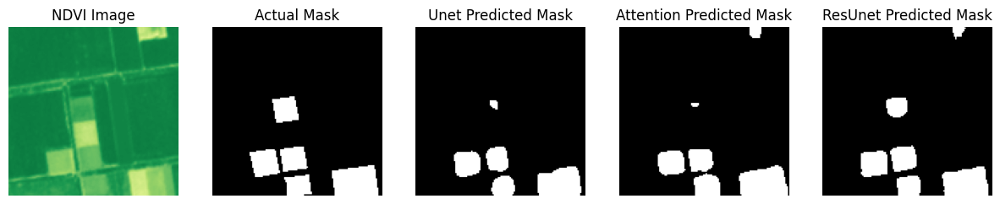

1/1 [==============================] - 0s 23ms/step


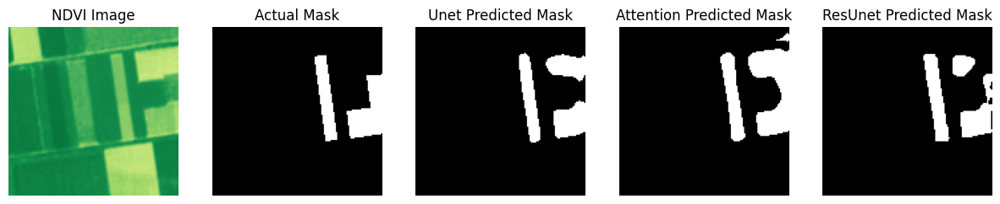

1/1 [==============================] - 0s 21ms/step


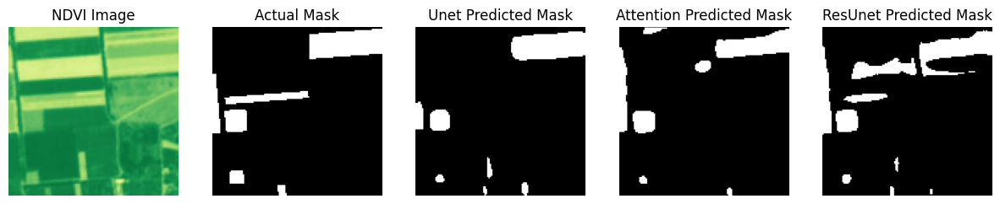

1/1 [==============================] - 0s 19ms/step


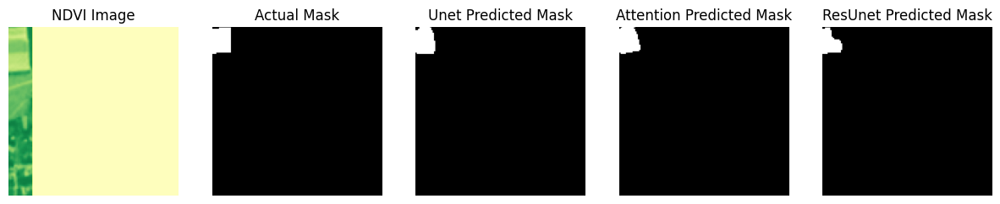

1/1 [==============================] - 0s 29ms/step


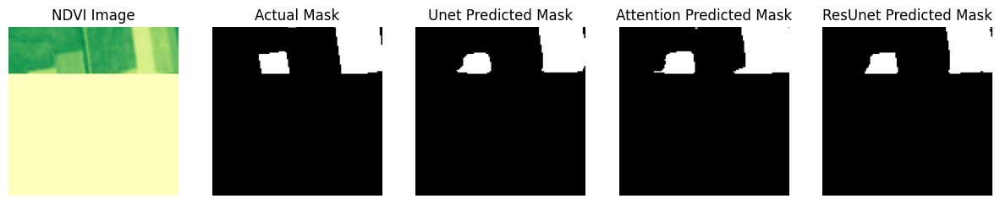

1/1 [==============================] - 0s 20ms/step


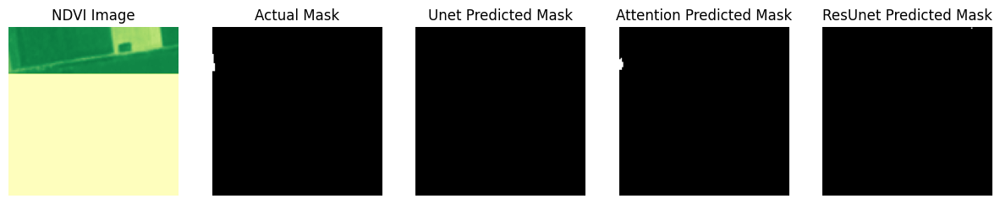

1/1 [==============================] - 0s 20ms/step


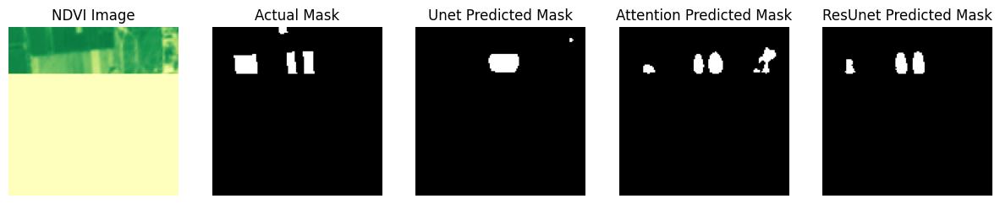

1/1 [==============================] - 0s 20ms/step


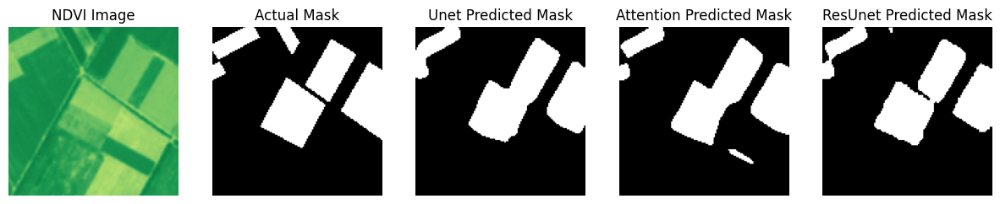

1/1 [==============================] - 0s 19ms/step


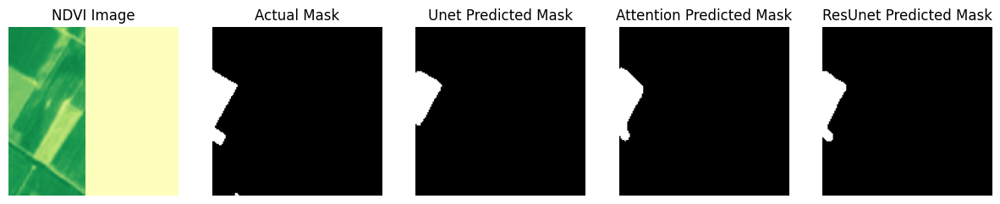

1/1 [==============================] - 0s 19ms/step


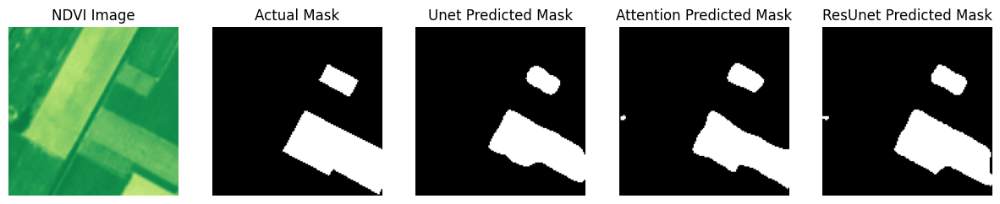

1/1 [==============================] - 0s 21ms/step


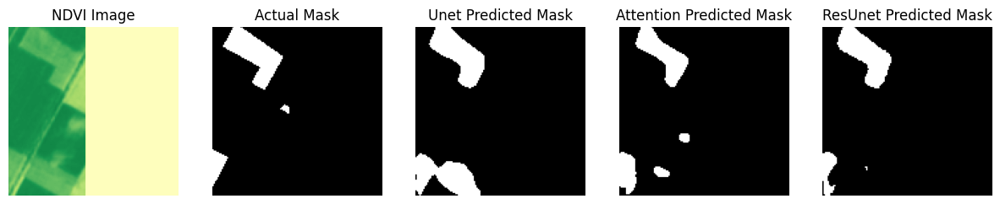

1/1 [==============================] - 0s 21ms/step


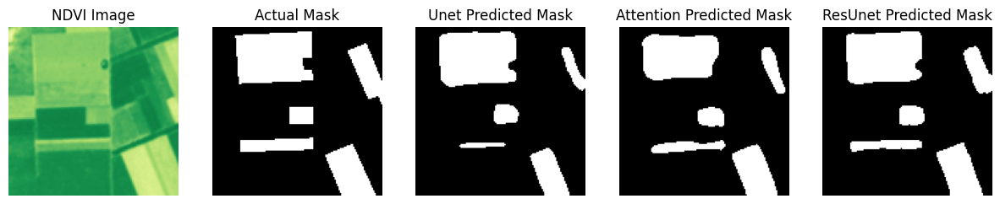

1/1 [==============================] - 0s 26ms/step


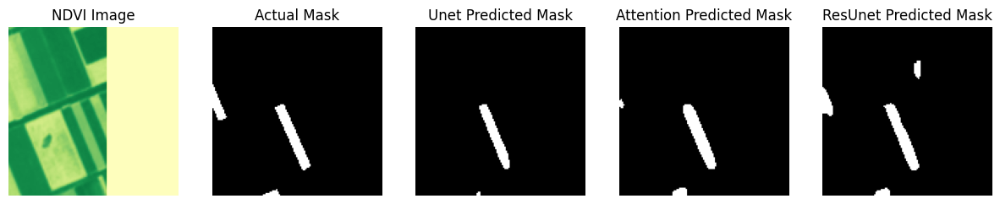

1/1 [==============================] - 0s 22ms/step


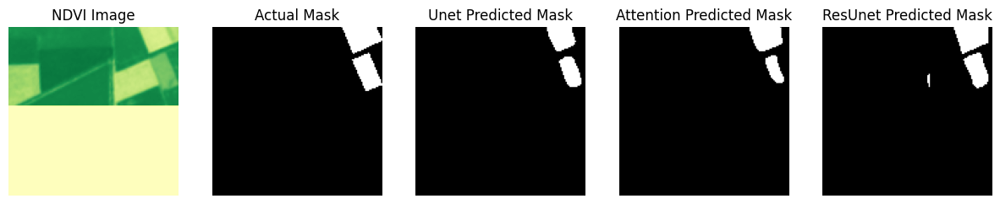

1/1 [==============================] - 0s 25ms/step


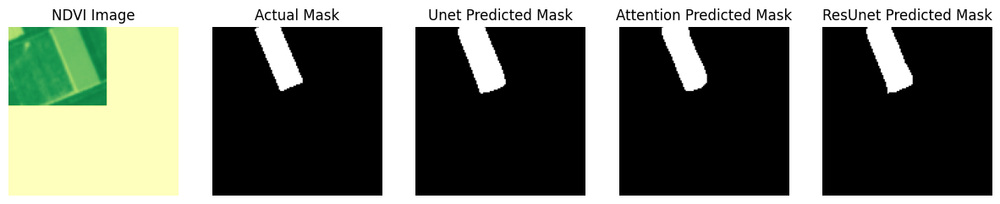

In [74]:
# Define the threshold for converting probability to binary mask
threshold = 0.5

# Loop over all images in the test set
for image_index in range(len(X_val_128)):
    input_image = X_val_128[image_index]
    actual_mask = y_val_128[image_index]
    input_image = np.expand_dims(input_image, axis=0)

    # Make prediction
    prediction_attention = model_attention_1.predict(input_image)
    prediction_resunet = model_ResUnet01.predict(input_image)
    prediction_unet = model_newUnet2.predict(input_image)
    predicted_mask_attention = (prediction_attention > threshold).astype(np.uint8)
    predicted_mask_resunet = (prediction_resunet > threshold).astype(np.uint8)
    predicted_mask_unet = (prediction_unet > threshold).astype(np.uint8)

    band8 = input_image[0, :, :, 7]  # NIR band
    band4 = input_image[0, :, :, 3]  # Red band
    ndvi = (band8 - band4) / (band8 + band4 + 1e-8)  # Add a small value to avoid division by zero

    # Plot the NDVI image and other masks side by side
    plt.figure(figsize=(15, 5))

    # Display the NDVI of the input image
    plt.subplot(1, 5, 1)
    plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    plt.title('NDVI Image')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(actual_mask[:, :, 0], cmap='gray')
    plt.title('Actual Mask')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(predicted_mask_unet[0, :, :, 0], cmap='gray')
    plt.title('Unet Predicted Mask')
    plt.axis('off')

    plt.subplot(1, 5, 4)
    plt.imshow(predicted_mask_attention[0, :, :, 0], cmap='gray')
    plt.title('Attention Predicted Mask')
    plt.axis('off')

    plt.subplot(1, 5, 5)
    plt.imshow(predicted_mask_resunet[0, :, :, 0], cmap='gray')
    plt.title('ResUnet Predicted Mask')
    plt.axis('off')

    plt.show()

# 12. Hyperparameter Tuning for Batch Size, Optimizer, Kernel Initilizer, Loss Function

## 11.1 Batch Size

In [ ]:
# Define the range of batch sizes to try
batch_sizes_to_try = [8, 16, 32]

# Number of epochs to train each model
num_epochs_per_size = 100

# Lists to store performance values for each batch size
performance_values = []

# Loop over each batch size
for batch_size in batch_sizes_to_try:
    print(f"Training with batch size: {batch_size}")

    # Create the ResUNet model
    model1 = ResUNet()

    # Compile the model
    model1.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])

    # Train the model
    history = model1.fit(X_train_128, y_train_128,
                                      batch_size=batch_size, epochs=num_epochs_per_size,
                                      validation_data=(X_val_128, y_val_128),shuffle=True, callbacks = [early_stopping])

    # Evaluate the model and store its performance
    _, dice_coefficient_value = model1.evaluate(X_val_128, y_val_128)
    performance_values.append(dice_coefficient_value)


Training with batch size: 8
Epoch 1/100
48/48 [==============================] - 29s 113ms/step - loss: 41.1451 - dice_coefficient: 0.6020 - val_loss: 11.8019 - val_dice_coefficient: 0.2173
Epoch 2/100
48/48 [==============================] - 4s 76ms/step - loss: 5.9914 - dice_coefficient: 0.7737 - val_loss: 3.0384 - val_dice_coefficient: 0.0000e+00
Epoch 3/100
48/48 [==============================] - 4s 78ms/step - loss: 1.8575 - dice_coefficient: 0.7939 - val_loss: 1.2778 - val_dice_coefficient: 0.0000e+00
Epoch 4/100
48/48 [==============================] - 4s 76ms/step - loss: 0.8324 - dice_coefficient: 0.8037 - val_loss: 0.7340 - val_dice_coefficient: 0.0000e+00
Epoch 5/100
48/48 [==============================] - 4s 76ms/step - loss: 0.4808 - dice_coefficient: 0.8094 - val_loss: 0.4204 - val_dice_coefficient: 0.6915
Epoch 6/100
48/48 [==============================] - 4s 77ms/step - loss: 0.2929 - dice_coefficient: 0.8299 - val_loss: 0.4137 - val_dice_coefficient: 0.0000e+00
Epoc

In [ ]:
# Find the best batch size based on the highest performance
best_batch_size_index = np.argmax(performance_values)
best_batch_size = batch_sizes_to_try[best_batch_size_index]

print(f"Best Batch Size: {best_batch_size}")

Best Batch Size: 8


## 11.2 Tuning of Optimizer

In [55]:
from tensorflow.keras.optimizers import Adam, SGD, RMSprop

# Define the list of optimizers to try
optimizers_to_try = [Adam(), SGD(), RMSprop()]

# Number of epochs to train each model
num_epochs_per_optimizer = 100

# Lists to store performance values for each optimizer
performance_values = []

# Loop over each optimizer
for optimizer in optimizers_to_try:
    print(f"Training with optimizer: {optimizer.__class__.__name__}")

    # Create the ResUNet model
    model_OptimizerTune = ResUNet()

    # Compile the model with the current optimizer
    model_OptimizerTune.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=[dice_coefficient])

    # Clear the history dictionary before training
    history1 = model_OptimizerTune.fit(X_train_128, y_train_128,
                                        batch_size=8, epochs=num_epochs_per_optimizer,
                                        validation_data=(X_val_128, y_val_128),shuffle=True, callbacks = [early_stopping])

    # Calculate Dice coefficient during training and store the values
    dice_values = history1.history['val_dice_coefficient']
    performance_values.append(dice_values)

# Print the performance values for each optimizer
for optimizer, dice_values in zip(optimizers_to_try, performance_values):
    print(f"Optimizer: {optimizer.__class__.__name__}")
    print(f"Dice Coefficient: {dice_values[-1]}")  # Get the final Dice coefficient value


Training with optimizer: Adam
Epoch 1/100
52/52 [==============================] - 33s 163ms/step - loss: 0.1888 - dice_coefficient: 0.6285 - val_loss: 8.0407 - val_dice_coefficient: 1.7961e-04
Epoch 2/100
52/52 [==============================] - 4s 78ms/step - loss: 0.1125 - dice_coefficient: 0.7855 - val_loss: 0.6050 - val_dice_coefficient: 0.3331
Epoch 3/100
52/52 [==============================] - 4s 77ms/step - loss: 0.0804 - dice_coefficient: 0.8520 - val_loss: 0.2885 - val_dice_coefficient: 0.4196
Epoch 4/100
52/52 [==============================] - 4s 76ms/step - loss: 0.0761 - dice_coefficient: 0.8589 - val_loss: 0.2276 - val_dice_coefficient: 0.5944
Epoch 5/100
52/52 [==============================] - 4s 76ms/step - loss: 0.0678 - dice_coefficient: 0.8766 - val_loss: 0.2099 - val_dice_coefficient: 0.5537
Epoch 6/100
52/52 [==============================] - 4s 77ms/step - loss: 0.0562 - dice_coefficient: 0.8976 - val_loss: 0.2446 - val_dice_coefficient: 0.5709
Epoch 7/100
52/5

## 11.3 Tuning for kernel init

In [ ]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping

def bn_act(x, act=True):
    x = L.BatchNormalization()(x)
    if act == True:
        x = L.Activation("leaky_relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1, l2_reg=0.02):
    conv = bn_act(x)
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(l2_reg))(conv)
    return conv

def stem(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1, dropout_rate=0.2):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)
    res = L.Dropout(dropout_rate)(res)  # Add dropout layer

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip):
    u = L.UpSampling2D((2, 2))(x)
    c = L.Concatenate()([u, xskip])
    return c

image_size = 128

import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping

# Define your utility functions and other code here

def ResUNet(kernel_initializer):
    f = [16, 32, 64, 128, 256]
    inputs = L.Input((image_size, image_size, 12))

    ## Encoder
    e0 = inputs
    e1 = stem(e0, f[0])
    e2 = residual_block(e1, f[1], strides=2)
    e3 = residual_block(e2, f[2], strides=2)
    e4 = residual_block(e3, f[3], strides=2)
    e5 = residual_block(e4, f[4], strides=2)

    ## Bridge
    b0 = conv_block(e5, f[4], strides=1)
    b1 = conv_block(b0, f[4], strides=1)

    ## Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, f[4])

    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, f[3])

    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, f[2])

    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, f[1])

    outputs = L.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = Model(inputs, outputs)

    # Set kernel initializer for appropriate layers
    for layer in model.layers:
        if isinstance(layer, L.Conv2D):
            layer.kernel_initializer = kernel_initializer

    return model

if __name__ == "__main__":
    input_shape = (128, 128, 12)
    image_size = input_shape[0]  # Update image size variable

    # List of kernel initializers to try
kernel_initializers_to_try = ['he_normal', 'glorot_uniform', 'variance_scaling']

best_kernel_initializer = None
best_dice_coefficient = 0.0

for kernel_initializer in kernel_initializers_to_try:
    print(f"Training with kernel initializer: {kernel_initializer}")

    model2 = ResUNet(kernel_initializer)

    # Create the EarlyStopping callback
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=10,
        restore_best_weights=True
    )

    model2.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])

    history = model2.fit(X_train_128, y_train_128,
                                                batch_size=8,
                                                verbose=1,
                                                epochs=100,
                                                validation_data=(X_val_128, y_val_128),
                                                shuffle=True, callbacks=[early_stopping])

    # Evaluate the model and store the dice coefficient
    _, dice_coefficient_value = model2.evaluate(X_val_128, y_val_128)
    print(f"Dice Coefficient with {kernel_initializer}: {dice_coefficient_value}")

    # Check if this kernel initializer performed better than the previous best
    if dice_coefficient_value > best_dice_coefficient:
        best_dice_coefficient = dice_coefficient_value
        best_kernel_initializer = kernel_initializer

print(f"Best performing kernel initializer: {best_kernel_initializer}")



Training with kernel initializer: he_normal
Epoch 1/100
48/48 [==============================] - 43s 117ms/step - loss: 40.7525 - dice_coefficient: 0.6503 - val_loss: 11.5178 - val_dice_coefficient: 0.0739
Epoch 2/100
48/48 [==============================] - 4s 76ms/step - loss: 5.7281 - dice_coefficient: 0.8006 - val_loss: 2.8946 - val_dice_coefficient: 0.0000e+00
Epoch 3/100
48/48 [==============================] - 4s 77ms/step - loss: 1.7325 - dice_coefficient: 0.8169 - val_loss: 1.2914 - val_dice_coefficient: 0.0000e+00
Epoch 4/100
48/48 [==============================] - 4s 77ms/step - loss: 0.7443 - dice_coefficient: 0.8355 - val_loss: 0.7774 - val_dice_coefficient: 0.0000e+00
Epoch 5/100
48/48 [==============================] - 4s 76ms/step - loss: 0.4474 - dice_coefficient: 0.8339 - val_loss: 0.5465 - val_dice_coefficient: 0.0000e+00
Epoch 6/100
48/48 [==============================] - 4s 77ms/step - loss: 0.2619 - dice_coefficient: 0.8408 - val_loss: 0.4853 - val_dice_coeffici

## 11.4 Tuning for loss function

In [ ]:
def focal_loss(y_true, y_pred):
    alpha = 0.25
    gamma = 2.0
    epsilon = tf.keras.backend.epsilon()

    pt = y_true * y_pred + (1 - y_true) * (1 - y_pred)
    pt = tf.keras.backend.clip(pt, epsilon, 1 - epsilon)
    focal_loss = -alpha * tf.keras.backend.pow(1 - pt, gamma) * tf.keras.backend.log(pt)

    return tf.reduce_mean(focal_loss)

def tversky_loss(y_true, y_pred):
    alpha = 0.7
    beta = 0.3
    epsilon = tf.keras.backend.epsilon()

    tp = tf.reduce_sum(y_true * y_pred)
    fn = tf.reduce_sum(y_true * (1 - y_pred))
    fp = tf.reduce_sum((1 - y_true) * y_pred)

    tversky = (tp + epsilon) / (tp + alpha * fn + beta * fp + epsilon)
    return 1 - tversky

In [ ]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping

def bn_act(x, act=True):
    x = L.BatchNormalization()(x)
    if act == True:
        x = L.Activation("leaky_relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1, l2_reg=0.02):
    conv = bn_act(x)
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.l2(l2_reg))(conv)
    return conv

def stem(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1, dropout_rate=0.2):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)
    res = L.Dropout(dropout_rate)(res)  # Add dropout layer

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip):
    u = L.UpSampling2D((2, 2))(x)
    c = L.Concatenate()([u, xskip])
    return c

image_size = 128
def ResUNet():
    f = [16, 32, 64, 128, 256]
    inputs = L.Input((image_size, image_size, 12))

    ## Encoder
    e0 = inputs
    e1 = stem(e0, f[0])
    e2 = residual_block(e1, f[1], strides=2)
    e3 = residual_block(e2, f[2], strides=2)
    e4 = residual_block(e3, f[3], strides=2)
    e5 = residual_block(e4, f[4], strides=2)

    ## Bridge
    b0 = conv_block(e5, f[4], strides=1)
    b1 = conv_block(b0, f[4], strides=1)

    ## Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, f[4])

    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, f[3])

    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, f[2])

    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, f[1])

    outputs = L.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = Model(inputs, outputs)
    return model

# Define the range of loss functions to try
loss_functions_to_try = [tf.keras.losses.binary_crossentropy, focal_loss, tversky_loss]  # Replace with actual loss functions

# Number of epochs to train each model
num_epochs_per_loss = 100

# Lists to store performance values for each loss function
performance_values = []

# Loop over each loss function
for loss_function in loss_functions_to_try:
    print(f"Training with loss function: {loss_function.__name__}")

    # Create the ResUNet model
    model = ResUNet()

    # Compile the model with the specified loss function
    model.compile(optimizer='adam', loss=loss_function, metrics=[dice_coefficient])

    # Train the model
    history = model.fit(X_train_128, y_train_128,
                        batch_size=8, epochs=num_epochs_per_loss,
                        validation_data=(X_val_128, y_val_128),
                        shuffle=True, callbacks=[early_stopping])

    # Evaluate the model and store its performance
    _, dice_coefficient_value = model.evaluate(X_val_128, y_val_128)
    performance_values.append(dice_coefficient_value)

# Find the best loss function based on the highest performance
best_loss_function_index = np.argmax(performance_values)
best_loss_function = loss_functions_to_try[best_loss_function_index]

print(f"Best Loss Function: {best_loss_function.__name__}")

Training with loss function: binary_crossentropy
Epoch 1/100
48/48 [==============================] - 25s 94ms/step - loss: 40.9850 - dice_coefficient: 0.6889 - val_loss: 11.6637 - val_dice_coefficient: 0.1478
Epoch 2/100
48/48 [==============================] - 4s 75ms/step - loss: 5.8491 - dice_coefficient: 0.8079 - val_loss: 2.9054 - val_dice_coefficient: 0.0080
Epoch 3/100
48/48 [==============================] - 4s 75ms/step - loss: 1.7528 - dice_coefficient: 0.8128 - val_loss: 1.2761 - val_dice_coefficient: 0.4984
Epoch 4/100
48/48 [==============================] - 4s 78ms/step - loss: 0.7871 - dice_coefficient: 0.8126 - val_loss: 0.6682 - val_dice_coefficient: 0.0000e+00
Epoch 5/100
48/48 [==============================] - 4s 75ms/step - loss: 0.4575 - dice_coefficient: 0.8083 - val_loss: 0.4456 - val_dice_coefficient: 0.2120
Epoch 6/100
48/48 [==============================] - 4s 75ms/step - loss: 0.2838 - dice_coefficient: 0.8324 - val_loss: 0.3810 - val_dice_coefficient: 0.0

# 13. ResUNet with tuned parameters

In [66]:
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping


def bn_act(x, act=True):
    x = L.BatchNormalization()(x)
    if act == True:
        x = L.Activation("relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = bn_act(x)
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal')(conv)
    return conv

def stem(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    conv = L.Conv2D(filters, kernel_size, padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3, 3), padding="same", strides=1):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)

    shortcut = L.Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides, kernel_initializer='he_normal')(x)
    shortcut = bn_act(shortcut, act=False)

    output = L.Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip):
    u = L.UpSampling2D((2, 2))(x)
    c = L.Concatenate()([u, xskip])
    return c

image_size = 128
def ResUNet():
    f = [16, 32, 64, 128, 256]
    inputs = L.Input((image_size, image_size, 12))

    ## Encoder
    e0 = inputs
    e1 = stem(e0, f[0])
    e2 = residual_block(e1, f[1], strides=2)
    e3 = residual_block(e2, f[2], strides=2)
    e4 = residual_block(e3, f[3], strides=2)
    e5 = residual_block(e4, f[4], strides=2)

    ## Bridge
    b0 = conv_block(e5, f[4], strides=1)
    b1 = conv_block(b0, f[4], strides=1)

    ## Decoder
    u1 = upsample_concat_block(b1, e4)
    d1 = residual_block(u1, f[4])

    u2 = upsample_concat_block(d1, e3)
    d2 = residual_block(u2, f[3])

    u3 = upsample_concat_block(d2, e2)
    d3 = residual_block(u3, f[2])

    u4 = upsample_concat_block(d3, e1)
    d4 = residual_block(u4, f[1])

    # Add dropout layers
    d1 = L.Dropout(0.2)(d1)
    d2 = L.Dropout(0.2)(d2)
    d3 = L.Dropout(0.2)(d3)
    d4 = L.Dropout(0.2)(d4)

    outputs = L.Conv2D(1, (1, 1), padding="same", activation="sigmoid")(d4)
    model = Model(inputs, outputs)
    return model

if __name__ == "__main__":
    input_shape = (128, 128, 12)
    model_ResUnet_final1 = ResUNet()
    model_ResUnet_final1.compile(optimizer='adam', loss='binary_crossentropy', metrics=[dice_coefficient])
    # Define EarlyStopping callback
    early_stopping = EarlyStopping(
        monitor='val_loss',    # Monitor validation loss
        patience=10,            # Number of epochs with no improvement after which training will be stopped
        restore_best_weights=True  # Restore model weights from the epoch with the best value of the monitored quantity
    )
    history = model_ResUnet_final1.fit(X_train_128, y_train_128,
                                batch_size=8,
                                verbose=1,
                                epochs=100,
                                validation_data=(X_val_128, y_val_128),
                                shuffle=True,callbacks=[early_stopping])

Epoch 1/100
52/52 [==============================] - 25s 90ms/step - loss: 0.2499 - dice_coefficient: 0.5628 - val_loss: 0.7241 - val_dice_coefficient: 0.0000e+00
Epoch 2/100
52/52 [==============================] - 4s 75ms/step - loss: 0.1220 - dice_coefficient: 0.7620 - val_loss: 0.4441 - val_dice_coefficient: 0.1904
Epoch 3/100
52/52 [==============================] - 4s 78ms/step - loss: 0.0964 - dice_coefficient: 0.8186 - val_loss: 0.3090 - val_dice_coefficient: 0.0000e+00
Epoch 4/100
52/52 [==============================] - 4s 74ms/step - loss: 0.0839 - dice_coefficient: 0.8462 - val_loss: 0.3837 - val_dice_coefficient: 0.0000e+00
Epoch 5/100
52/52 [==============================] - 4s 76ms/step - loss: 0.0867 - dice_coefficient: 0.8426 - val_loss: 0.2158 - val_dice_coefficient: 0.2859
Epoch 6/100
52/52 [==============================] - 4s 78ms/step - loss: 0.0733 - dice_coefficient: 0.8661 - val_loss: 0.2066 - val_dice_coefficient: 0.1870
Epoch 7/100
52/52 [====================

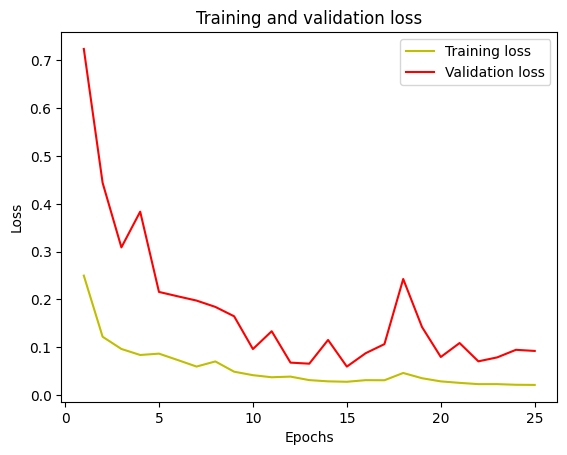

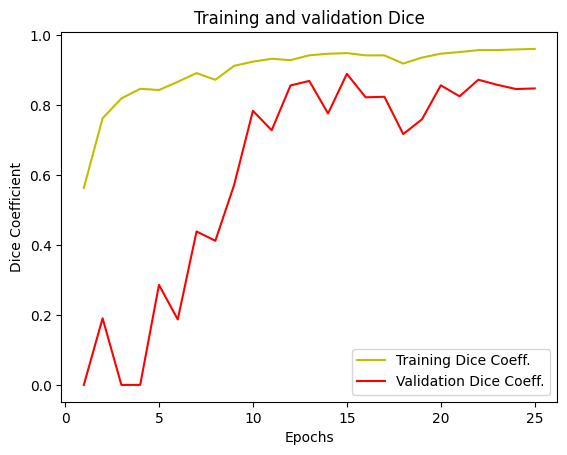

In [67]:
############################################################
#Evaluate the model
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


jc = history.history['dice_coefficient']
val_jc = history.history['val_dice_coefficient']

plt.plot(epochs, jc, 'y', label='Training Dice Coeff.')
plt.plot(epochs, val_jc, 'r', label='Validation Dice Coeff.')
plt.title('Training and validation Dice')
plt.xlabel('Epochs')
plt.ylabel('Dice Coefficient')
plt.legend()
plt.show()

In [68]:
# Evaluate the model on the training set
train_loss, train_dice_coeff = model_ResUnet_final1.evaluate(X_train_128, y_train_128, verbose=0)

# Evaluate the model on the test set
val_loss, val_dice_coeff = model_ResUnet_final1.evaluate(X_val_128, y_val_128, verbose=0)

# Print the results
print("Training Loss:", train_loss)
print("Training Dice Coefficient:", train_dice_coeff)
print("Val Loss:", val_loss)
print("Val Dice Coefficient:", val_dice_coeff)

Training Loss: 0.030830897390842438
Training Dice Coefficient: 0.942998468875885
Val Loss: 0.05955914035439491
Val Dice Coefficient: 0.8874695897102356


In [70]:
def custom_evaluation(X, y):
    y_pred = model_ResUnet_final1.predict(X)
    dice = dice_coefficient(y, y_pred)
    return dice

# Evaluate the model using the custom evaluation function
test_dice_score = custom_evaluation(X_test_128, y_test_128)
print("Dice score for Test Set is:", test_dice_score)


1/1 [==============================] - 1s 522ms/step
Dice score for Test Set is: tf.Tensor(0.8827628, shape=(), dtype=float32)


1/1 [==============================] - 0s 24ms/step


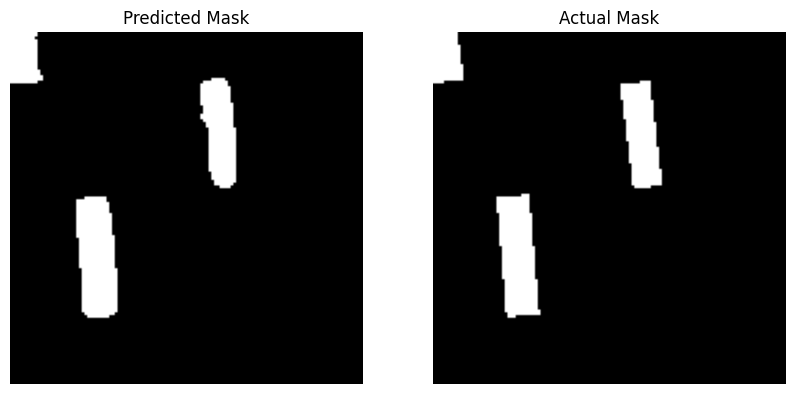

1/1 [==============================] - 0s 22ms/step


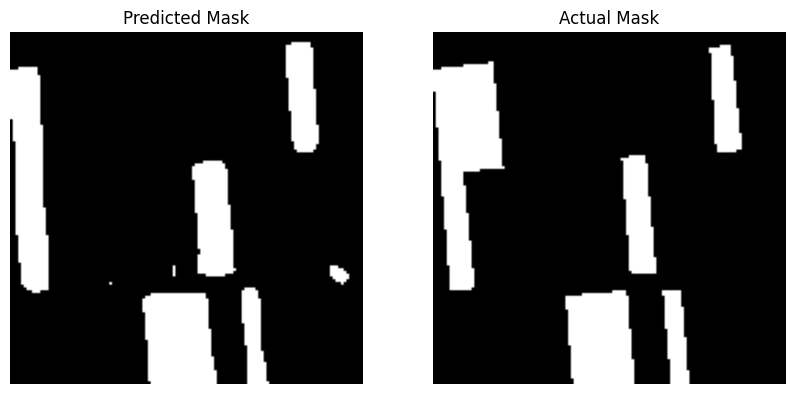

1/1 [==============================] - 0s 21ms/step


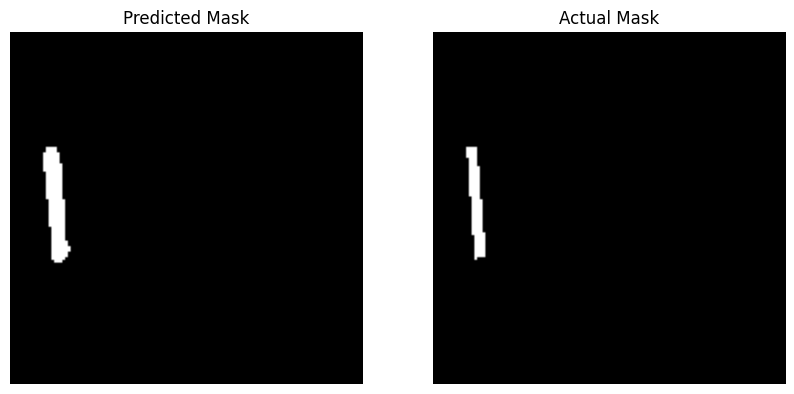

1/1 [==============================] - 0s 20ms/step


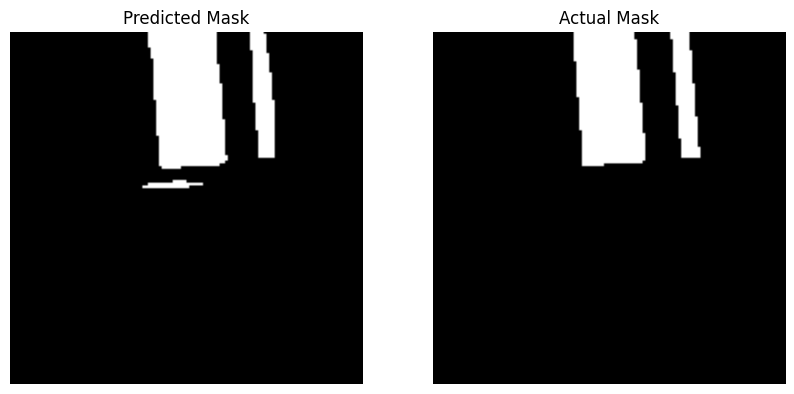

1/1 [==============================] - 0s 20ms/step


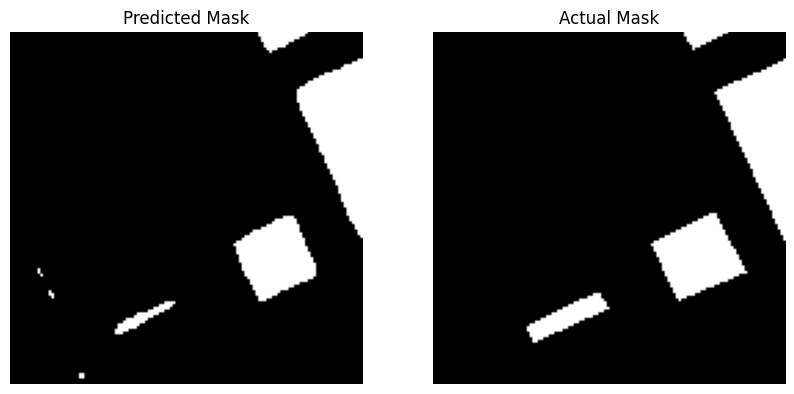

1/1 [==============================] - 0s 24ms/step


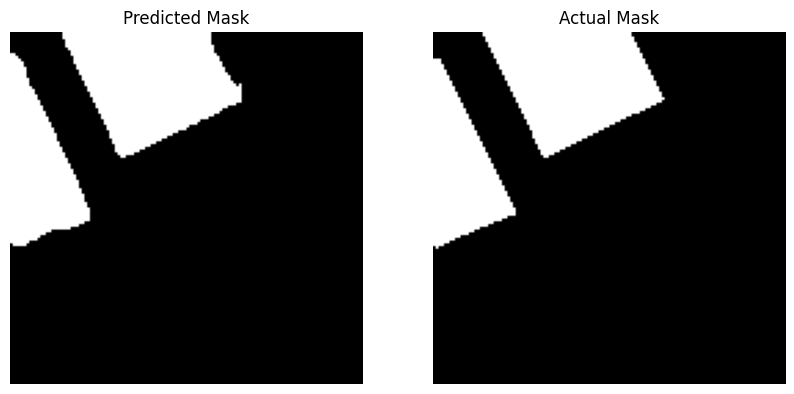

1/1 [==============================] - 0s 35ms/step


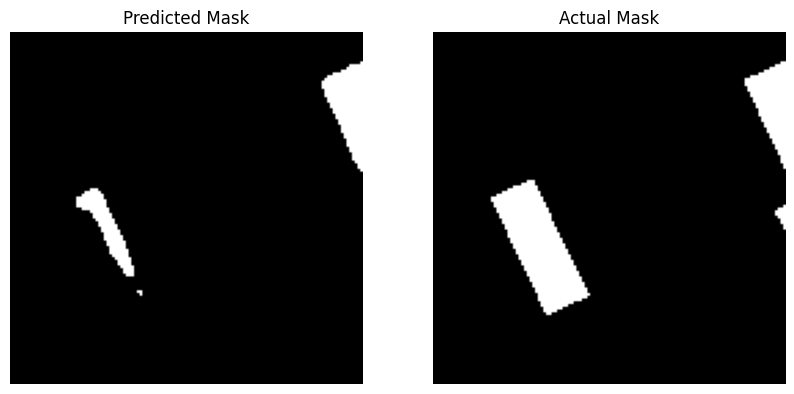

1/1 [==============================] - 0s 32ms/step


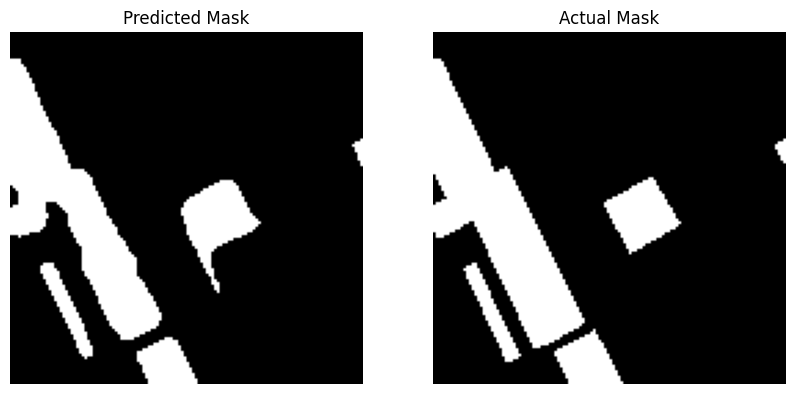

1/1 [==============================] - 0s 38ms/step


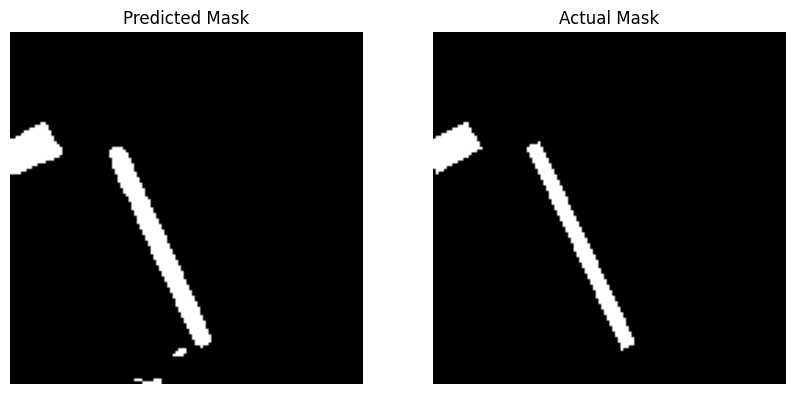

1/1 [==============================] - 0s 34ms/step


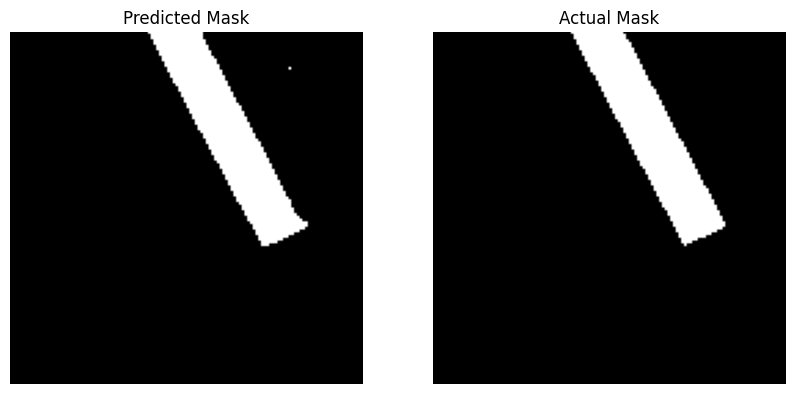

1/1 [==============================] - 0s 33ms/step


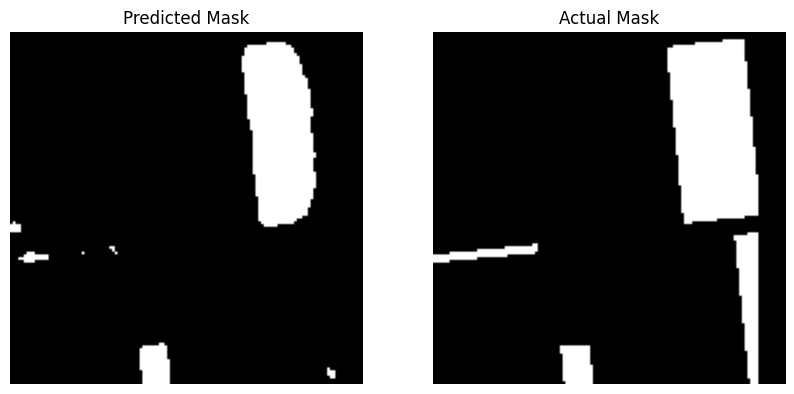

1/1 [==============================] - 0s 33ms/step


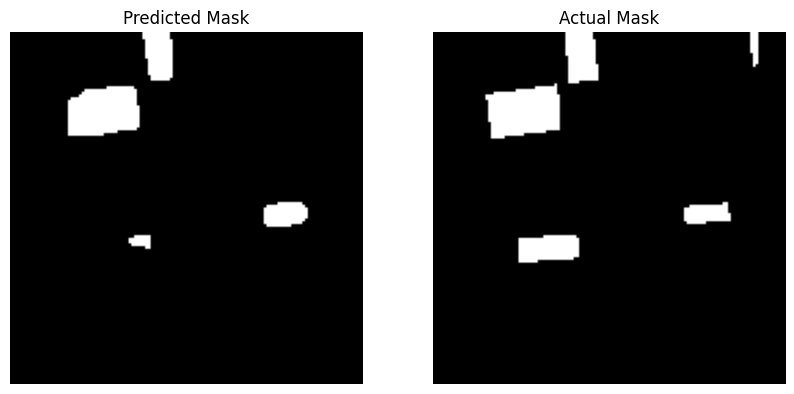

1/1 [==============================] - 0s 34ms/step


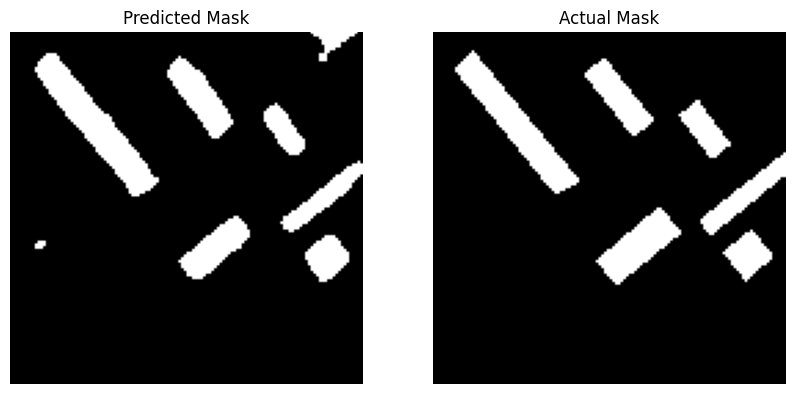

1/1 [==============================] - 0s 42ms/step


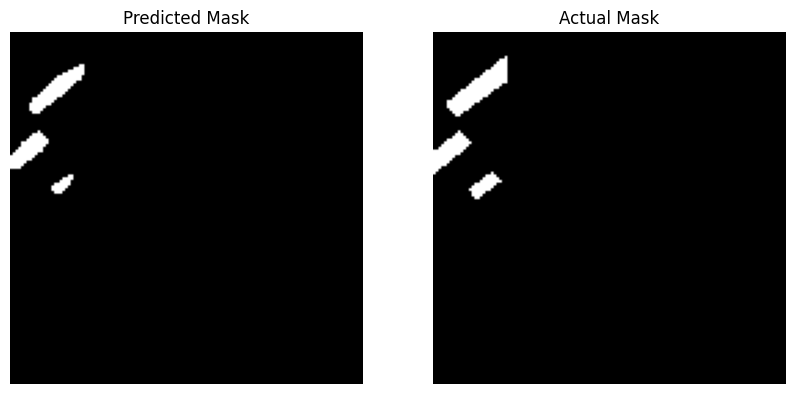

In [71]:
threshold = 0.5

for image_index in range(len(X_test_128)):
    input_image = X_test_128[image_index]
    actual_mask = y_test_128[image_index]
    input_image = np.expand_dims(input_image, axis=0)

    # Make prediction
    prediction = model_ResUnet_final1.predict(input_image)

    # Threshold the probability map to get the binary mask
    predicted_mask = (prediction > threshold).astype(np.uint8)

    # Plot the predicted mask and the actual mask side by side
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(predicted_mask[0, :, :, 0], cmap='gray')
    plt.title('Predicted Mask')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(actual_mask[:, :, 0], cmap='gray')
    plt.title('Actual Mask')
    plt.axis('off')

    plt.show()

# 14. Predictions on Test Set

1/1 [==============================] - 0s 41ms/step


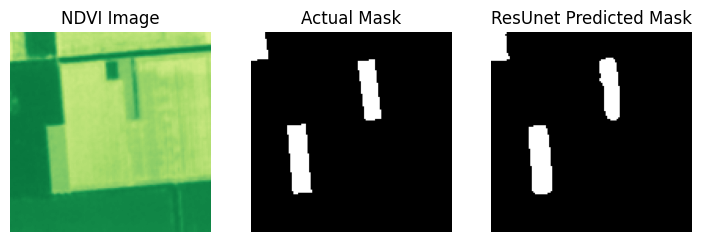

1/1 [==============================] - 0s 39ms/step


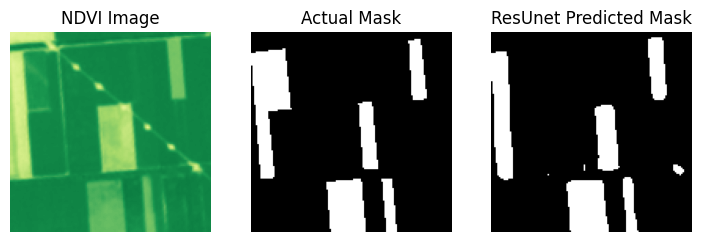

1/1 [==============================] - 0s 39ms/step


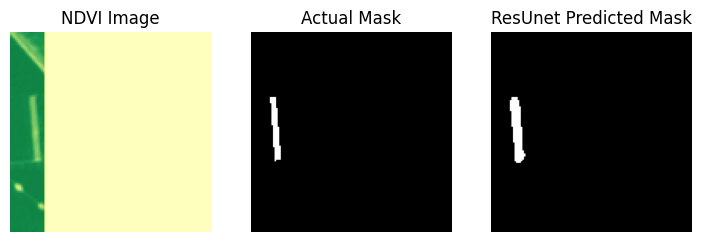

1/1 [==============================] - 0s 104ms/step


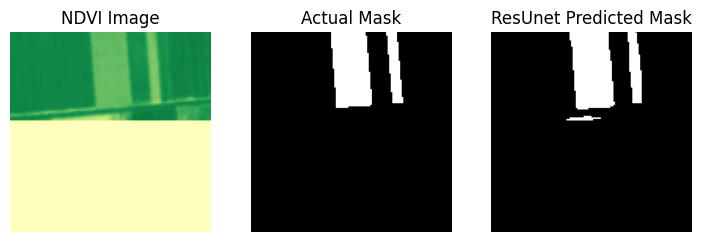

1/1 [==============================] - 0s 43ms/step


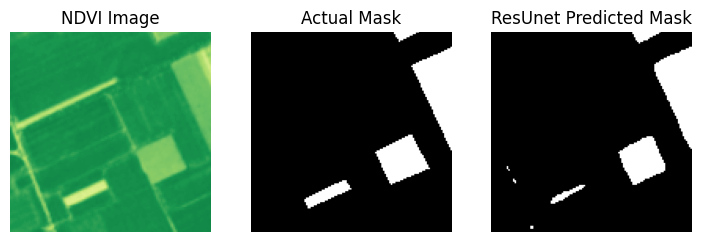

1/1 [==============================] - 0s 35ms/step


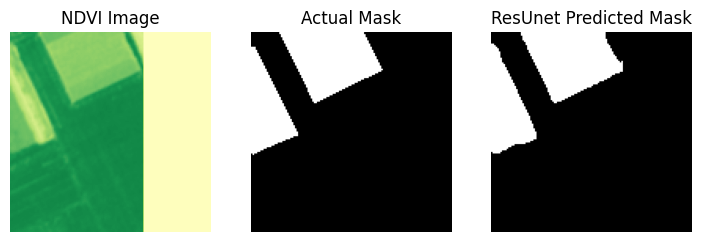

1/1 [==============================] - 0s 42ms/step


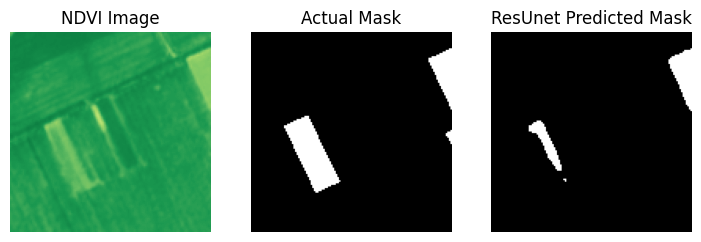

1/1 [==============================] - 0s 32ms/step


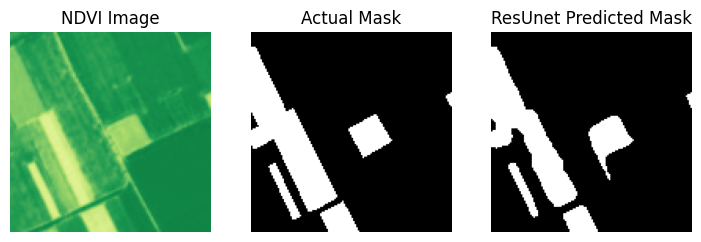

1/1 [==============================] - 0s 32ms/step


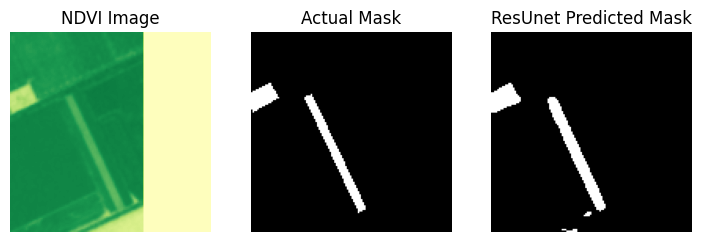

1/1 [==============================] - 0s 32ms/step


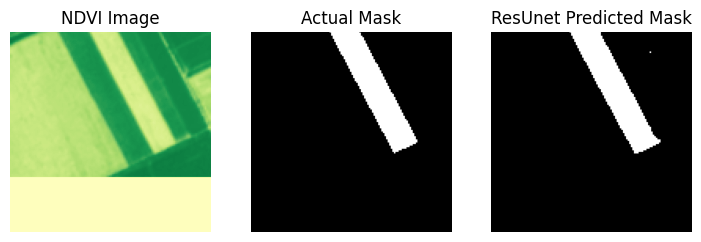

1/1 [==============================] - 0s 35ms/step


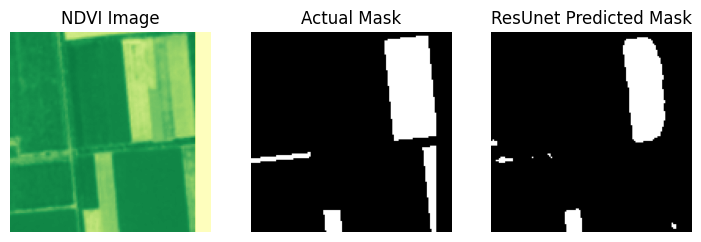

1/1 [==============================] - 0s 34ms/step


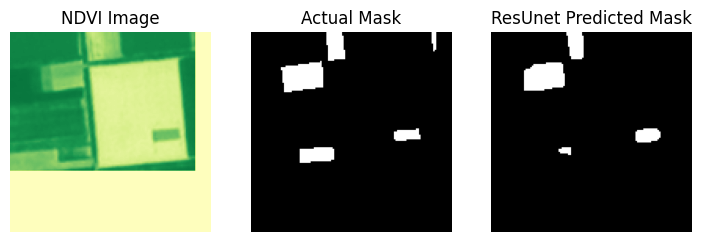

1/1 [==============================] - 0s 32ms/step


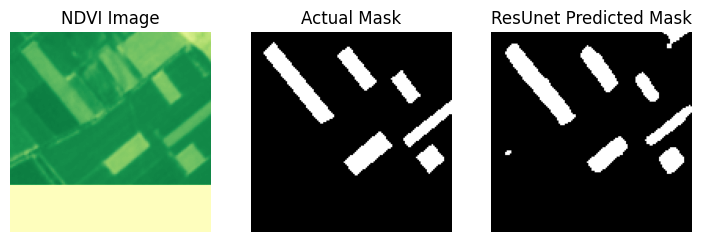

1/1 [==============================] - 0s 33ms/step


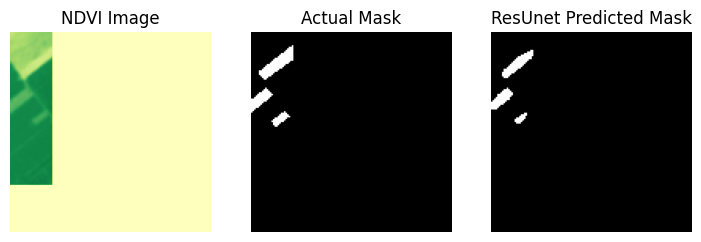

In [73]:
threshold = 0.5
# Loop over all images in the test set
for image_index in range(len(X_test_128)):
    # Take the specific image and its corresponding mask from the test set
    input_image = X_test_128[image_index]
    actual_mask = y_test_128[image_index]

    # Expand dimensions to create a batch of size 1
    input_image = np.expand_dims(input_image, axis=0)

    # Make prediction
    prediction_resunet = model_ResUnet_final1.predict(input_image)
    predicted_mask_resunet = (prediction_resunet > threshold).astype(np.uint8)

    # Compute NDVI for the input_image
    band8 = input_image[0, :, :, 7]  # NIR band
    band4 = input_image[0, :, :, 3]  # Red band
    ndvi = (band8 - band4) / (band8 + band4 + 1e-8)  # Add a small value to avoid division by zero

    # Plot the NDVI image and other masks side by side
    plt.figure(figsize=(15, 5))

    # Display the NDVI of the input image
    plt.subplot(1, 5, 1)
    plt.imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    plt.title('NDVI Image')
    plt.axis('off')

    plt.subplot(1, 5, 2)
    plt.imshow(actual_mask[:, :, 0], cmap='gray')
    plt.title('Actual Mask')
    plt.axis('off')

    plt.subplot(1, 5, 3)
    plt.imshow(predicted_mask_resunet[0, :, :, 0], cmap='gray')
    plt.title('ResUnet Predicted Mask')
    plt.axis('off')

    plt.show()